<h1> Amazon Apparel Recommendations </h1>

In [1]:
# Importing necessary Libraries

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import pickle
import re

import math
import time
import os
import nltk
from bs4 import BeautifulSoup
from nltk.tokenize import word_tokenize
from gensim.models import Word2Vec

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout
plotly.offline.init_notebook_mode(connected = True)


In [3]:
# loading the json data using pandas 'read_json' command.
data = pd.read_json('tops_fashion.json')
data.head()

,asin,author,availability,availability_type,brand,color,editorial_reivew,editorial_review,formatted_price,large_image_url,manufacturer,medium_image_url,model,product_type_name,publisher,reviews,sku,small_image_url,title
0,B016I2TS4W,None,None,None,FNC7C,None,NaN,Minions Como Superheroes Ironman Women's O Nec...,None,https://images-na.ssl-images-amazon.com/images...,None,https://images-na.ssl-images-amazon.com/images...,None,SHIRT,None,"[False, https://www.amazon.com/reviews/iframe?...",None,https://images-na.ssl-images-amazon.com/images...,Minions Como Superheroes Ironman Long Sleeve R...
1,B01N49AI08,None,None,None,FIG Clothing,None,NaN,Sizing runs on the small side. FIG® recommends...,None,https://images-na.ssl-images-amazon.com/images...,None,https://images-na.ssl-images-amazon.com/images...,None,SHIRT,None,"[False, https://www.amazon.com/reviews/iframe?...",None,https://images-na.ssl-images-amazon.com/images...,FIG Clothing Womens Izo Tunic
2,B01JDPCOHO,None,None,None,FIG Clothing,None,NaN,Sizing runs on the small side. FIG® recommends...,None,https://images-na.ssl-images-amazon.com/images...,None,https://images-na.ssl-images-amazon.com/images...,None,SHIRT,None,"[False, https://www.amazon.com/reviews/iframe?...",None,https://images-na.ssl-images-amazon.com/images...,FIG Clothing Womens Won Top
3,B01N19U5H5,None,None,None,Focal18,None,NaN,100% Brand New & Fashion<br> Quantity: 1 Piece...,None,https://images-na.ssl-images-amazon.com/images...,None,https://images-na.ssl-images-amazon.com/images...,None,SHIRT,None,"[True, https://www.amazon.com/reviews/iframe?a...",None,https://images-na.ssl-images-amazon.com/images...,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...
4,B004GSI2OS,None,Usually ships in 6-10 business days,now,FeatherLite,Onyx Black/ Stone,NaN,,$26.26,https://images-na.ssl-images-amazon.com/images...,None,https://images-na.ssl-images-amazon.com/images...,None,SHIRT,None,"[False, https://www.amazon.com/reviews/iframe?...",None,https://images-na.ssl-images-amazon.com/images...,Featherlite Ladies' Long Sleeve Stain Resistan...


In [4]:
print('The shape of the data is:', data.shape)
print('\nThe columns in the data are:\n',data.columns)

The shape of the data is: (183138, 19)

The columns in the data are:
 Index(['asin', 'author', 'availability', 'availability_type', 'brand', 'color',
       'editorial_reivew', 'editorial_review', 'formatted_price',
       'large_image_url', 'manufacturer', 'medium_image_url', 'model',
       'product_type_name', 'publisher', 'reviews', 'sku', 'small_image_url',
       'title'],
      dtype='object')


Of these 19 features, we will be using only 6 features in this workshop.
    1. asin  ( Amazon standard identification number)
    2. brand ( brand to which the product belongs to )
    3. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes ) 
    4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
    5. medium_image_url  ( url of the image )
    6. title (title of the product.)
    7. formatted_price (price of the product)

In [5]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]
data.head(3)

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None


### Stats for product type

In [6]:
# count matches total count and hence no missing values
data['product_type_name'].describe()

count     183138
unique        72
top        SHIRT
freq      167794
Name: product_type_name, dtype: object

In [7]:
print('Shirts count for a whopping ', str((167794/183138)* 100) ,'%')

Shirts count for a whopping  91.62161867007393 %


In [8]:
unique_products = data['product_type_name'].unique()
unique_products

array(['SHIRT', 'SWEATER', 'APPAREL', 'OUTDOOR_RECREATION_PRODUCT',
       'BOOKS_1973_AND_LATER', 'PANTS', 'HAT', 'SPORTING_GOODS', 'DRESS',
       'UNDERWEAR', 'SKIRT', 'OUTERWEAR', 'BRA', 'ACCESSORY',
       'ART_SUPPLIES', 'SLEEPWEAR', 'ORCA_SHIRT', 'HANDBAG',
       'PET_SUPPLIES', 'SHOES', 'KITCHEN', 'ADULT_COSTUME',
       'HOME_BED_AND_BATH', 'MISC_OTHER', 'BLAZER',
       'HEALTH_PERSONAL_CARE', 'TOYS_AND_GAMES', 'SWIMWEAR',
       'CONSUMER_ELECTRONICS', 'SHORTS', 'HOME', 'AUTO_PART',
       'OFFICE_PRODUCTS', 'ETHNIC_WEAR', 'BEAUTY',
       'INSTRUMENT_PARTS_AND_ACCESSORIES', 'POWERSPORTS_PROTECTIVE_GEAR',
       'SHIRTS', 'ABIS_APPAREL', 'AUTO_ACCESSORY', 'NONAPPARELMISC',
       'TOOLS', 'BABY_PRODUCT', 'SOCKSHOSIERY',
       'POWERSPORTS_RIDING_SHIRT', 'EYEWEAR', 'SUIT', 'OUTDOOR_LIVING',
       'POWERSPORTS_RIDING_JACKET', 'HARDWARE', 'SAFETY_SUPPLY',
       'ABIS_DVD', 'VIDEO_DVD', 'GOLF_CLUB', 'MUSIC_POPULAR_VINYL',
       'HOME_FURNITURE_AND_DECOR', 'TABLET_COMPUTER',

In [9]:
# top 10 products in terms of value
# series to list and then applying counter and getting top 10

Counter(data['product_type_name']).most_common(10)

[('SHIRT', 167794),
 ('APPAREL', 3549),
 ('BOOKS_1973_AND_LATER', 3336),
 ('DRESS', 1584),
 ('SPORTING_GOODS', 1281),
 ('SWEATER', 837),
 ('OUTERWEAR', 796),
 ('OUTDOOR_RECREATION_PRODUCT', 729),
 ('ACCESSORY', 636),
 ('UNDERWEAR', 425)]

### Stats for Brand

In [10]:
data['brand'].describe()

count     182987
unique     10577
top         Zago
freq         223
Name: brand, dtype: object

In [11]:
missing_values = data.shape[0] - data['brand'].count()
missing_valuesmissing_values = data.shape[0] - data['brand'].count()
missing_values

151

In [12]:
# top 10 brand types

Counter(data['brand']).most_common(10)

[('Zago', 223),
 ('XQS', 222),
 ('Yayun', 215),
 ('YUNY', 198),
 ('XiaoTianXin-women clothes', 193),
 ('Generic', 192),
 ('Boohoo', 190),
 ('Alion', 188),
 ('Abetteric', 187),
 ('TheMogan', 187)]

### Stats for color

In [13]:
data['color'].describe()

count     64956
unique     7380
top       Black
freq      13207
Name: color, dtype: object

In [14]:
missing_values = data.shape[0] - data['color'].count()
missing_values

118182

In [15]:
# top 10 colors types

Counter(data['color']).most_common(10)

[(None, 118182),
 ('Black', 13207),
 ('White', 8616),
 ('Blue', 3570),
 ('Red', 2289),
 ('Pink', 1842),
 ('Grey', 1499),
 ('*', 1388),
 ('Green', 1258),
 ('Multi', 1203)]

In [16]:
print('Black acccounts for a count of: {0:.2f}%'.format((13207/183138)* 100))

Black acccounts for a count of: 7.21%


### Stats for formatted price

In [17]:
data['formatted_price'].describe()

count      28395
unique      3135
top       $19.99
freq         945
Name: formatted_price, dtype: object

In [18]:
print('Price info provided: {0:.2f}%'.format((28395/183138)* 100))

Price info provided: 15.50%


In [19]:
# top 10 price types

Counter(data['formatted_price']).most_common(10)

[(None, 154743),
 ('$19.99', 945),
 ('$9.99', 749),
 ('$9.50', 601),
 ('$14.99', 472),
 ('$7.50', 463),
 ('$24.99', 414),
 ('$29.99', 370),
 ('$8.99', 343),
 ('$9.01', 336)]

### Stats for titles

In [20]:
data['title'].describe()

count                                                183138
unique                                               175985
top       Nakoda Cotton Self Print Straight Kurti For Women
freq                                                     77
Name: title, dtype: object

In [21]:
# The number of datapoints where all are present.

data[data['formatted_price'].notnull()].count()

asin                 28395
brand                28302
color                28385
medium_image_url     28395
product_type_name    28395
title                28395
formatted_price      28395
dtype: int64

In [22]:
print('A total of {0:.2f}% of datapoints are null in one or the other features'.format(((183138-28395) / 183138)* 100))

A total of 84.50% of datapoints are null in one or the other features


### Preprocessing the missing values in color and considering the datapoints with color feature

In [22]:
# You can download all these 183k images using this code below.
# You do NOT need to run this code and hence it is commented.


'''
from PIL import Image
import requests
from io import BytesIO

for index, row in images.iterrows():
        url = row['large_image_url']
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        img.save('images/28k_images/'+row['asin']+'.jpeg')


'''

"\nfrom PIL import Image\nimport requests\nfrom io import BytesIO\n\nfor index, row in images.iterrows():\n        url = row['large_image_url']\n        response = requests.get(url)\n        img = Image.open(BytesIO(response.content))\n        img.save('images/28k_images/'+row['asin']+'.jpeg')\n\n\n"

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183138 entries, 0 to 183137
Data columns (total 7 columns):
asin                 183138 non-null object
brand                182987 non-null object
color                64956 non-null object
medium_image_url     183138 non-null object
product_type_name    183138 non-null object
title                183138 non-null object
formatted_price      28395 non-null object
dtypes: object(7)
memory usage: 9.8+ MB


In [24]:
data[['color']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183138 entries, 0 to 183137
Data columns (total 1 columns):
color    64956 non-null object
dtypes: object(1)
memory usage: 1.4+ MB


In [25]:
# filling the datapoints with a word 'None'

data1 = data.fillna(value = {'color':'None'})

In [26]:
# considering the datapoints without the word 'None'

data1 = data1[data1['color'] != 'None']
data1.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
5,B00TAEHGGS,Fitscloth,Grape,https://images-na.ssl-images-amazon.com/images...,SHIRT,[Fits Cloth] Grape Solid Modern Long Sleeve Pl...,None
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
8,B06Y2LCC5S,Fashion2ne1,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,Standing on His Promises Rhinestones T-Shirt R...,None
11,B001LOUGE4,Fitness Etc.,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,Ladies Cotton Tank 2x1 Ribbed Tank Top,$11.99


In [27]:
data1.shape

(64956, 7)

### Deduplication

In [28]:
# returns boolean True and False. here True is considered 1 and False as 0, hece summation of all 1's
sum(data1['title'].duplicated())

3277

### These shirts are exactly same except in size (S, M,L,XL)

<table>
<tr> 
<td><img src="B00AQ4GMCK.jpeg",width=100,height=100> :B00AQ4GMCK</td>
<td><img src="B00AQ4GMTS.jpeg",width=100,height=100> :B00AQ4GMTS</td>
</tr>
<tr> 
<td><img src="B00AQ4GMLQ.jpeg",width=100,height=100> :B00AQ4GMLQ</td>
<td><img src="B00AQ4GN3I.jpeg",width=100,height=100> :B00AQ4GN3I</td>
</tr>
</table>

### These shirts exactly same except  in color

<table>
<tr> 
<td><img src="B00G278GZ6.jpeg",width=100,height=100> :B00G278GZ6</td>
<td><img src="B00G278W6O.jpeg",width=100,height=100> :B00G278W6O</td>
</tr>
<tr> 
<td><img src="B00G278Z2A.jpeg",width=100,height=100> :B00G278Z2A</td>
<td><img src="B00G2786X8.jpeg",width=100,height=100> :B00G2786X8</td>
</tr>
</table>

### In our data there are many duplicate products like the above examples, we need to de-dupe them for better results.

### Part - I

In [29]:
data1['title'].head()

4     Featherlite Ladies' Long Sleeve Stain Resistan...
5     [Fits Cloth] Grape Solid Modern Long Sleeve Pl...
6     Women's Unique 100% Cotton T - Special Olympic...
8     Standing on His Promises Rhinestones T-Shirt R...
11               Ladies Cotton Tank 2x1 Ribbed Tank Top
Name: title, dtype: object

In [30]:
# removing titles whose length of words are less than 5 as they are useless.

data1_sorted = data1[data1['title'].apply(lambda x: len(x.split()) > 4)]

In [31]:
data1_sorted['title'].head()

4     Featherlite Ladies' Long Sleeve Stain Resistan...
5     [Fits Cloth] Grape Solid Modern Long Sleeve Pl...
6     Women's Unique 100% Cotton T - Special Olympic...
8     Standing on His Promises Rhinestones T-Shirt R...
11               Ladies Cotton Tank 2x1 Ribbed Tank Top
Name: title, dtype: object

In [32]:
data1_sorted.shape

(63374, 7)

In [33]:
data1_sorted.sort_values(by = 'title', inplace = True)
data1_sorted.head(3)

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
118987,B008D30AGK,Out+of+Print+Clothing,Multicolored,https://images-na.ssl-images-amazon.com/images...,SHIRT,"""1984"" Retro Book Cover Women's SLim Fit T-Shi...",$7.51
149224,B01E0XLYHA,GreaterGood,Blue,https://images-na.ssl-images-amazon.com/images...,SHIRT,"""Ask Me About My Granddog"" T-Shirt",None
78827,B003IDE8XQ,Maggie's Organics,Grey,https://images-na.ssl-images-amazon.com/images...,HOME,"""Camisoles Grey - Medium Fair Labor, 1 pc""",$18.99


### Some examples of duplicate titles that differ only in the last few words.

<pre>
Titles 1:
16. woman's place is in the house and the senate shirts for Womens XXL White
17. woman's place is in the house and the senate shirts for Womens M Grey

Title 2:
25. tokidoki The Queen of Diamonds Women's Shirt X-Large
26. tokidoki The Queen of Diamonds Women's Shirt Small
27. tokidoki The Queen of Diamonds Women's Shirt Large

Title 3:
61. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
62. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
63. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
64. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
</pre>

In [34]:
"""iterrows means separation of a row in two parts of (index, rest of row) in series
and here we are appending all indexes in indicies list.(in short, picking all indexes)"""

indices = []
for i, j in data1_sorted.iterrows():
    indices.append(i)
    
indices[:5]

[118987, 149224, 78827, 50056, 36310]

In [35]:
import itertools

stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data1_sorted.shape[0]

while i < num_data_points and j < num_data_points:
    
    previous_i = i

    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt',
    # 'X-Large']
    a = data1['title'].loc[indices[i]].split()

    # search for the similar products sequentially 
    j = i+1
    while j < num_data_points:

        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 
        # 'Shirt', 'Small']
        b = data1['title'].loc[indices[j]].split()

        # store the maximum length of two strings
        length = max(len(a), len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of 
        # unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        # if the number of words in which both strings differ are > 2 , we are considering it as those two apparels are 
        # different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apparels are 
        # same, hence we are ignoring (removing) them. 
        if (length - count) > 2: # number of words in which both sentences differ
            # if both strings differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(data1_sorted['asin'].loc[indices[i]])

            # start searching for similar apparels corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [36]:
data1 = data1.loc[data1['asin'].isin(stage1_dedupe_asins)]
data1.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
5,B00TAEHGGS,Fitscloth,Grape,https://images-na.ssl-images-amazon.com/images...,SHIRT,[Fits Cloth] Grape Solid Modern Long Sleeve Pl...,None
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
16,B00L3C0O2S,FEA Merchandising,Light,https://images-na.ssl-images-amazon.com/images...,SHIRT,FEA Merchandising Juniors Florida Georgia Line...,None
17,B00XIM7A1Y,FIFA,Grey,https://images-na.ssl-images-amazon.com/images...,SHIRT,World Cup USA Heather Grey Juniors Soft Tank Top,None


In [37]:
data1.shape

(48792, 7)

### Part - II

<pre>

In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which are adjacent and very similar title

But there are some products whose titles are not adjacent but very similar.

Examples:

Titles-1
86261.  UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large
115042. UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL

TItles-2
75004.  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee
109225. EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees
120832. EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt

</pre>

In [38]:
# This code snippet takes significant amount of time.
# O(n^2) time.
# Takes about an hour to run on a decent computer.

indices = []
for i,row in data1.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices) != 0:
    i = indices.pop()
    stage2_dedupe_asins.append(data1['asin'].loc[i])
    # consider the first apperal's title
    a = data1['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt',
    # 'X-Large']
    for j in indices:
        
        b = data1['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 
        # 'Shirt', 'X-Large']
        
        length = max(len(a),len(b))
        
        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of 
        # unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same,
        # hence we are ignoring (removing) them.
        if (length - count) < 3:
            indices.remove(j)

In [39]:
data1 = data1.loc[data1['asin'].isin(stage2_dedupe_asins)]

print('Number of data points after stage two of dedupe: ',data1.shape[0])

Number of data points after stage two of dedupe:  44585


* The data has been reduced from 48792 to 44585, and saving the data onto pickle file.

In [40]:
# Storing these products in a pickle file

data1.to_pickle('67k_apparel_data')

# Importing data1 as data

In [2]:
data = pd.read_pickle('16k_apparel_data')
print(data.shape)
data.head(3)

(16042, 7)


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,FeatherLite Ladies' Moisture Free Mesh Sport S...,$20.54


# Text pre-processing

In [3]:
import contractions
import re
from nltk.corpus import stopwords

sw = set(stopwords.words('english'))
len(sw)

179

In [4]:
# Defining our function to remove punctuations and spl chars.

def clean_sentence(text):
    text = BeautifulSoup(text, 'lxml').get_text() # removes html tags such as <br />
    text = text.lower() # converts text to lower case
    text = contractions.fix(text) # converts (don't) to (do not)
    text = text.replace('\\r\\n', '').replace('nan', '')
    text = re.sub('\W+',' ',text) # removes all special chars, punc
    text = ' '.join(e for e in text.split() if e not in sw) # removes stopwords
    text = ''.join([i for i in text if not i.isdigit()]) # removes numbers
    text = text.split()
    text1 = []
    for i in text:
        if "_" in i:
            del i # removes string if it contains '_'
        else:
            text1.append(i)
    text = " ".join(text1)
    text = ' '.join([i for i in text.split() if len(i)>1]) # https://stackoverflow.com/a/32705991/10219869
    
    return text

In [5]:
data['title'].head()

4     Featherlite Ladies' Long Sleeve Stain Resistan...
6     Women's Unique 100% Cotton T - Special Olympic...
15    FeatherLite Ladies' Moisture Free Mesh Sport S...
27    Supernatural Chibis Sam Dean And Castiel O Nec...
46    Fifth Degree Womens Gold Foil Graphic Tees Jun...
Name: title, dtype: object

In [6]:
title = [clean_sentence(i) for i in data['title']]
title[:5]

['featherlite ladies long sleeve stain resistant tapered twill shirt xl onyx black stone',
 'women unique cotton special olympics world games white size',
 'featherlite ladies moisture free mesh sport shirt white xxx large',
 'supernatural chibis sam dean castiel neck shirts female purple',
 'fifth degree womens gold foil graphic tees junior top short sleeve printed shirt']

In [7]:
data['title'] = title
data['title'].head()

4     featherlite ladies long sleeve stain resistant...
6     women unique cotton special olympics world gam...
15    featherlite ladies moisture free mesh sport sh...
27    supernatural chibis sam dean castiel neck shir...
46    fifth degree womens gold foil graphic tees jun...
Name: title, dtype: object

# Text based product similarity
### Utility Functions which we will use through the rest of the workshop.

In [8]:
data = pd.read_pickle('16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
27,B014ICEJ1Q,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel neck tshi...,$7.39
46,B01NACPBG2,Fifth Degree,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,fifth degree womens gold foil graphic tees jun...,$6.95


In [9]:
# Display an image
# https://stackoverflow.com/a/23489503/10219869
def display_img(url, ax, fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
  

 # plotting code to understand the algorithm's decision.
    
def plot_heatmap(keys, values, labels, url, text):
        
        # keys: list of words of recommended title [w1, w3, w2....]
        # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i) [1, 2, 1,1, 0, 3....]
        # labels: len(labels) == len(keys), the values of labels depends on the model we are using like 
                # [all words correspondingly]
                # if model == 'bag of words': labels(i) = values(i)
                # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        # url : apparel's url

        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title
        
        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # we call dispaly_img based with url
        display_img(url, ax, fig)
        
        # displays combine figure (heat map and image together)
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, model):

    # doc_id : index of the title1
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recommended apparel (used to keep title of image)
    # model, it can be any of the models, 
        # 1. bag_of_words
        # 2. tfidf
        # 3. idf

    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    
    # if ith word in intersection(list of words of title1 and list of words of title2): values(i)=count of that word in 
    # title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]
    
    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
        # if model == 'bag of words': labels(i) = values(i)
        # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))

    if model == 'bag_of_words':
        labels = values
    
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
                
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, model)


# this function gets a list of words along with the frequency of each word given "text"

def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    return Counter(words) # Counter counts the occurence of each word in list, it returns dict type object {word1:count}


def get_result(doc_id, text1, text2, url, model):
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, model)

# Bag of Words (BoW) on product titles.

In [10]:
title_features = CountVectorizer()
title_features = title_features.fit_transform(data['title'])
title_features.get_shape()

(16042, 12609)

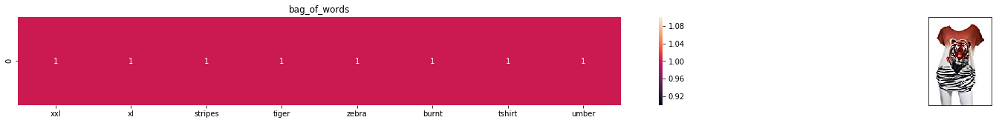

ASIN : B00JXQB5FQ
Brand: Si Row
Title: burnt umber tiger tshirt zebra stripes xl  xxl 
Euclidean similarity with the query image : 0.0


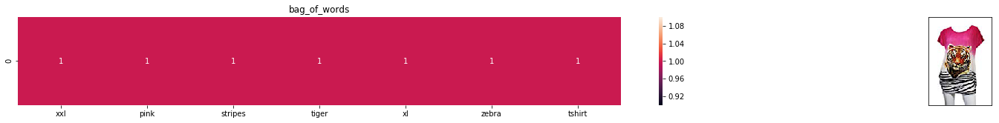

ASIN : B00JXQASS6
Brand: Si Row
Title: pink tiger tshirt zebra stripes xl  xxl 
Euclidean similarity with the query image : 1.7320508075688772


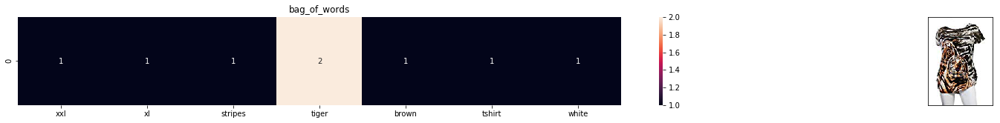

ASIN : B00JXQCWTO
Brand: Si Row
Title: brown  white tiger tshirt tiger stripes xl  xxl 
Euclidean similarity with the query image : 2.449489742783178


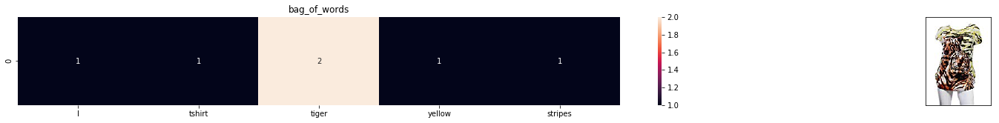

ASIN : B00JXQCUIC
Brand: Si Row
Title: yellow tiger tshirt tiger stripes  l 
Euclidean similarity with the query image : 2.6457513110645907


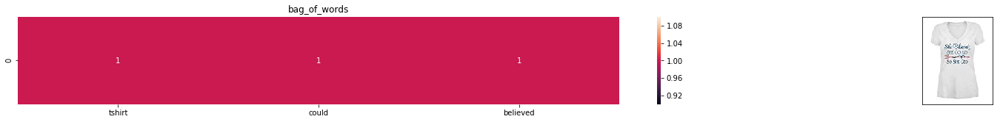

ASIN : B07568NZX4
Brand: Rustic Grace
Title: believed could tshirt 
Euclidean similarity with the query image : 3.0


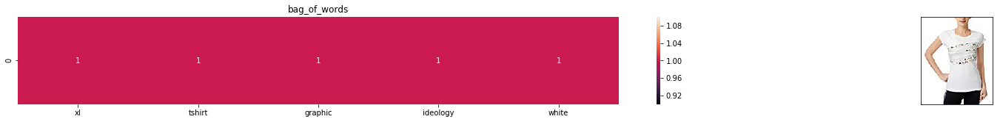

ASIN : B01NB0NKRO
Brand: Ideology
Title: ideology graphic tshirt xl white 
Euclidean similarity with the query image : 3.0


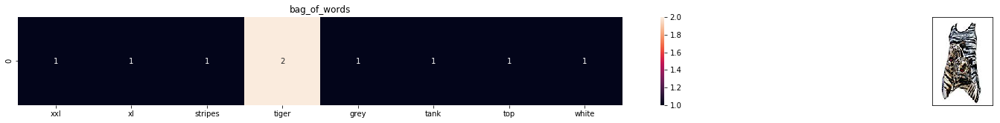

ASIN : B00JXQAFZ2
Brand: Si Row
Title: grey  white tiger tank top tiger stripes xl  xxl 
Euclidean similarity with the query image : 3.0


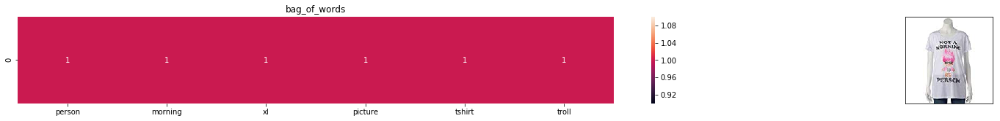

ASIN : B01CLS8LMW
Brand: Awake
Title: morning person tshirt  troll picture  xl 
Euclidean similarity with the query image : 3.1622776601683795


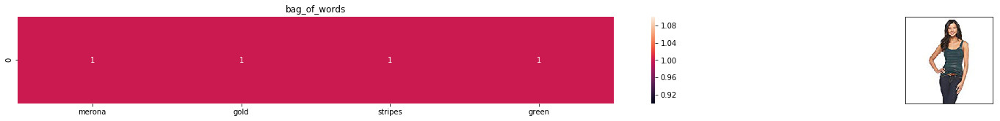

ASIN : B01KVZUB6G
Brand: Merona
Title: merona green gold stripes 
Euclidean similarity with the query image : 3.1622776601683795


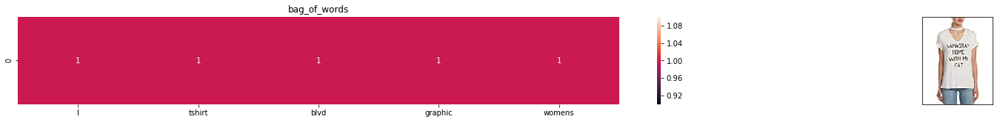

ASIN : B0733R2CJK
Brand: BLVD
Title: blvd womens graphic tshirt l 
Euclidean similarity with the query image : 3.1622776601683795


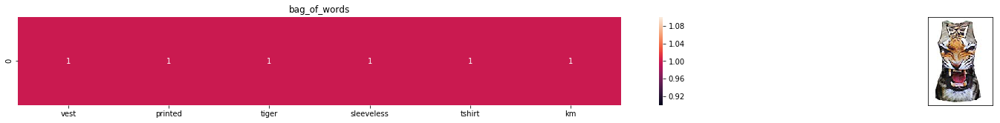

ASIN : B012VQLT6Y
Brand: KM T-shirt
Title: km tiger printed sleeveless vest tshirt 
Euclidean similarity with the query image : 3.1622776601683795


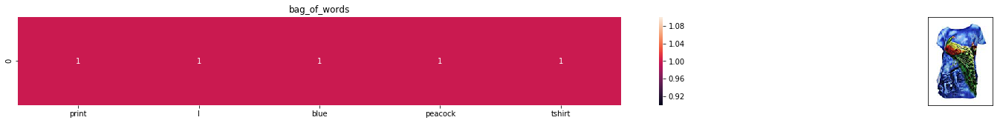

ASIN : B00JXQC8L6
Brand: Si Row
Title: blue peacock print tshirt  l 
Euclidean similarity with the query image : 3.1622776601683795


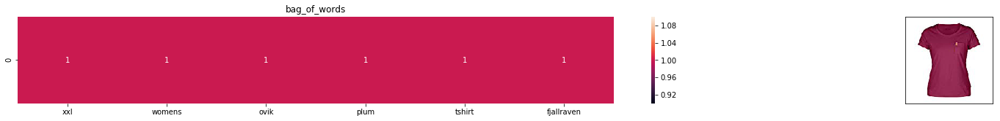

ASIN : B06XC3CZF6
Brand: Fjallraven
Title: fjallraven  womens ovik tshirt plum xxl 
Euclidean similarity with the query image : 3.1622776601683795


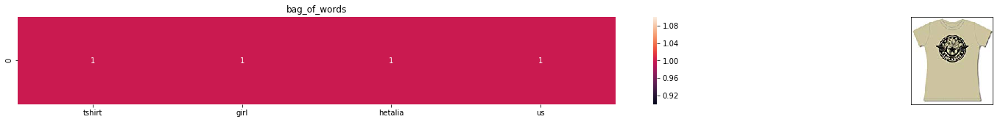

ASIN : B005IT8OBA
Brand: Hetalia
Title: hetalia us girl tshirt 
Euclidean similarity with the query image : 3.1622776601683795


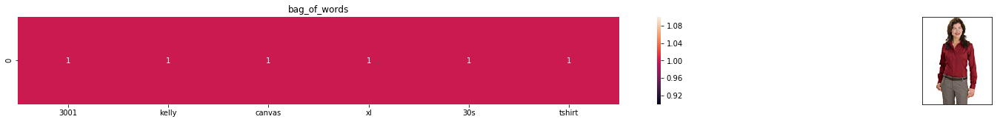

ASIN : B0088PN0LA
Brand: Red House
Title: canvas 3001 30s tshirt  kelly  xl 
Euclidean similarity with the query image : 3.1622776601683795


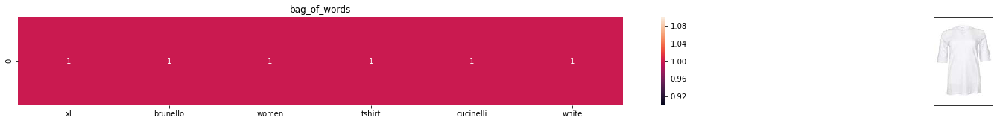

ASIN : B06X99V6WC
Brand: Brunello Cucinelli
Title: brunello cucinelli tshirt women white xl 
Euclidean similarity with the query image : 3.1622776601683795


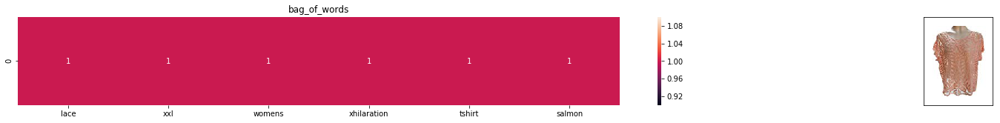

ASIN : B06Y1JPW1Q
Brand: Xhilaration
Title: xhilaration womens lace tshirt salmon xxl 
Euclidean similarity with the query image : 3.1622776601683795


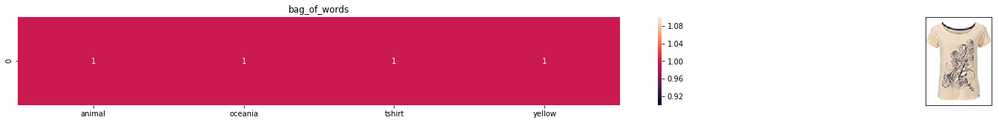

ASIN : B06X6GX6WG
Brand: Animal
Title: animal oceania tshirt  yellow 
Euclidean similarity with the query image : 3.1622776601683795


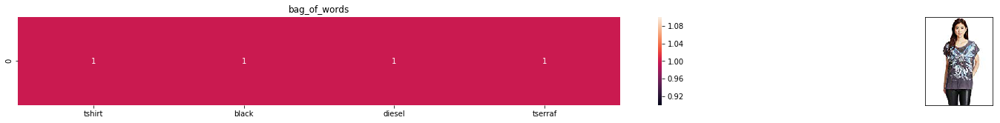

ASIN : B017X8PW9U
Brand: Diesel
Title: diesel tserraf tshirt black 
Euclidean similarity with the query image : 3.1622776601683795


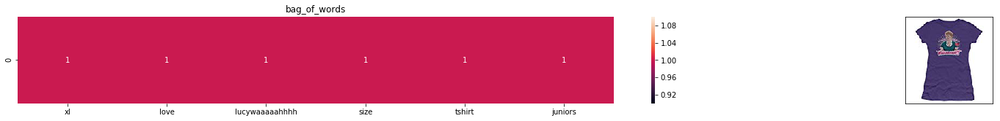

ASIN : B00IAA4JIQ
Brand: I Love Lucy
Title: juniors love lucywaaaaahhhh tshirt size xl 
Euclidean similarity with the query image : 3.1622776601683795


In [11]:

def bag_of_words_model(doc_id, num_results):
    
    # doc_id: apparel's id in given corpus
    # num_results implies the comparision datapoints like 20, 25, any number.
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(title_features, title_features[doc_id])
    
    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)): 
        
        # we will pass 1. doc_id, 2. text1, 3. text2, url, model
        get_result(doc_id = indices[i], text1 = data['title'].loc[df_indices[i]], text2 = data['title'].loc[df_indices[i]], 
                   url= data['medium_image_url'].loc[df_indices[i]], model = 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)

#call the bag-of-words model for a product to get similar products.
bag_of_words_model(12566, 20) # change the index if you want to.
# In the output heat map each value represents the count value 
# of the label word, the color represents the intersection 
# with inputs title.

#try 12566
#try 931

# TF-IDF based product similarity

In [12]:
tfidf_title_vectorizer = TfidfVectorizer()
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])
# tfidf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# tfidf_title_features[doc_id, index_of_word_in_corpus] = tfidf values of the word in given doc
tfidf_title_features.get_shape()

(16042, 12609)

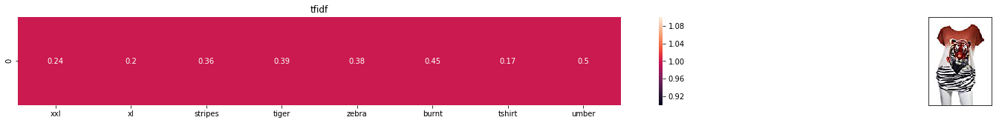

ASIN : B00JXQB5FQ
BRAND : Si Row
Eucliden distance from the given image : 0.0


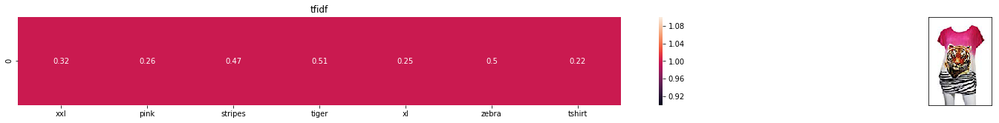

ASIN : B00JXQASS6
BRAND : Si Row
Eucliden distance from the given image : 0.7536331912451363


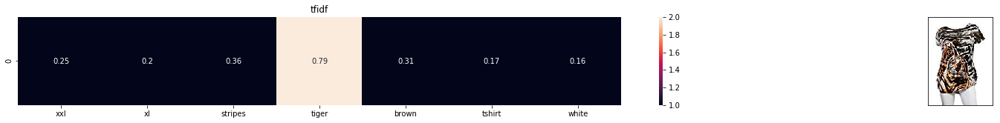

ASIN : B00JXQCWTO
BRAND : Si Row
Eucliden distance from the given image : 0.9357643943769647


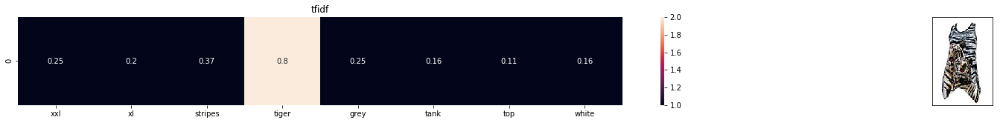

ASIN : B00JXQAFZ2
BRAND : Si Row
Eucliden distance from the given image : 0.9586153524200749


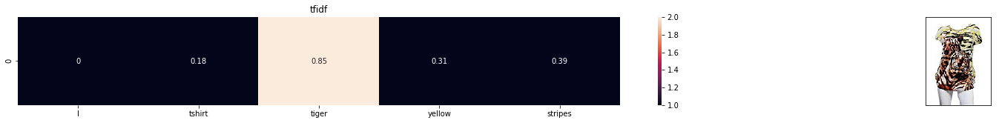

ASIN : B00JXQCUIC
BRAND : Si Row
Eucliden distance from the given image : 1.000074961446881


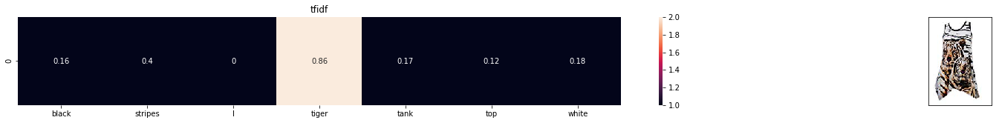

ASIN : B00JXQAO94
BRAND : Si Row
Eucliden distance from the given image : 1.023215552457452


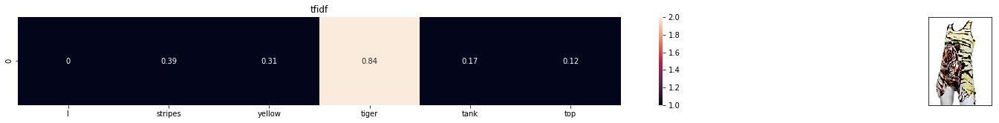

ASIN : B00JXQAUWA
BRAND : Si Row
Eucliden distance from the given image : 1.031991846303421


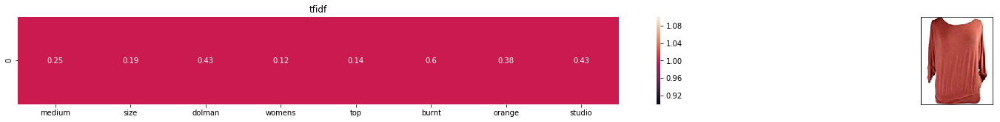

ASIN : B06XSCVFT5
BRAND : Studio M
Eucliden distance from the given image : 1.2106843670424716


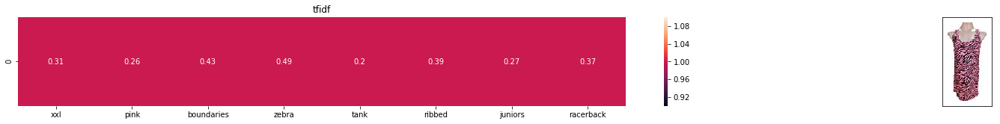

ASIN : B06Y2GTYPM
BRAND : No Boundaries
Eucliden distance from the given image : 1.2121683810720831


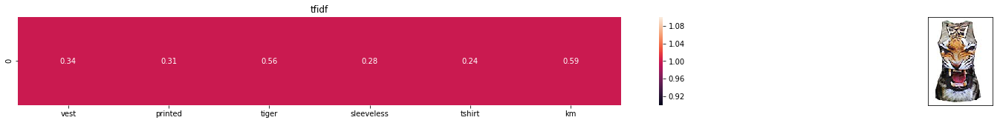

ASIN : B012VQLT6Y
BRAND : KM T-shirt
Eucliden distance from the given image : 1.219790640280982


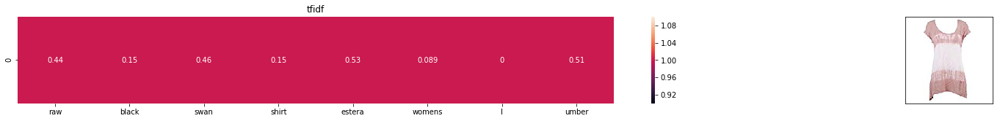

ASIN : B06Y1VN8WQ
BRAND : Black Swan
Eucliden distance from the given image : 1.2206849659998316


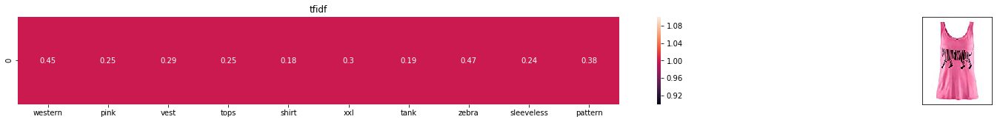

ASIN : B00Z6HEXWI
BRAND : Black Temptation
Eucliden distance from the given image : 1.221281392120943


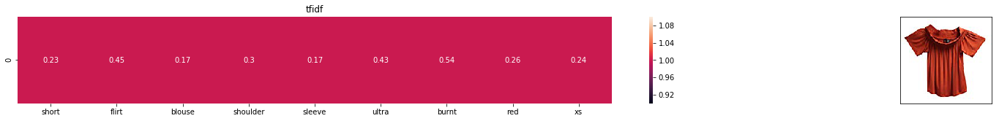

ASIN : B074TR12BH
BRAND : Ultra Flirt
Eucliden distance from the given image : 1.2313364094597743


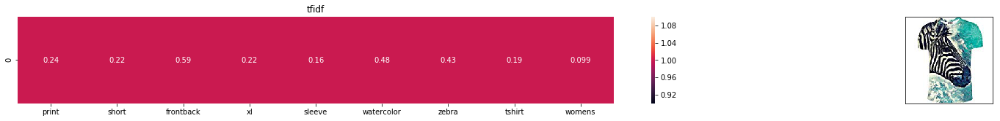

ASIN : B072R2JXKW
BRAND : WHAT ON EARTH
Eucliden distance from the given image : 1.2318451972624516


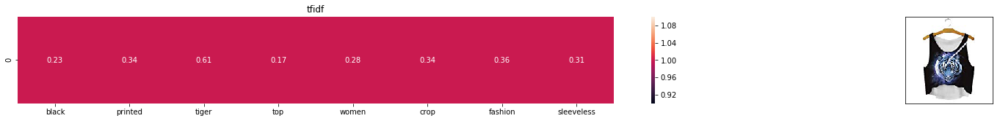

ASIN : B074T8ZYGX
BRAND : MKP Crop Top
Eucliden distance from the given image : 1.2340607457359425


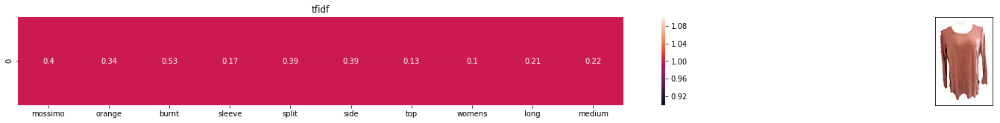

ASIN : B071ZDF6T2
BRAND : Mossimo
Eucliden distance from the given image : 1.2352785577664824


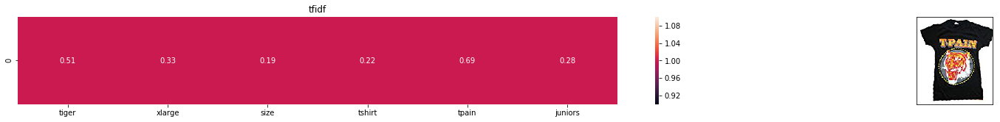

ASIN : B01K0H02OG
BRAND : Tultex
Eucliden distance from the given image : 1.236457298812782


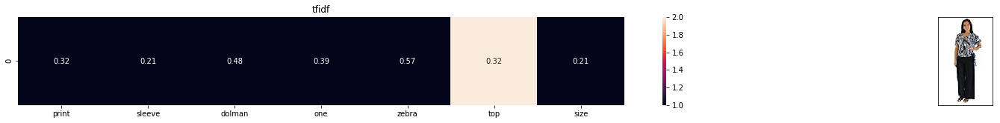

ASIN : B00H8A6ZLI
BRAND : Vivian's Fashions
Eucliden distance from the given image : 1.24996155052848


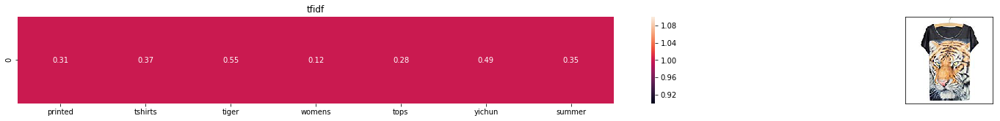

ASIN : B010NN9RXO
BRAND : YICHUN
Eucliden distance from the given image : 1.2535461420856102


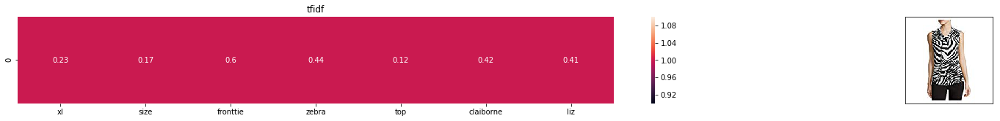

ASIN : B06XBY5QXL
BRAND : Liz Claiborne
Eucliden distance from the given image : 1.2538832938357722


In [16]:
def tfidf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(tfidf_title_features, tfidf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        
        # we will pass 1. doc_id, 2. text1, 3. text2, url, model
        get_result(doc_id = indices[i], text1 = data['title'].loc[df_indices[i]], text2 = data['title'].loc[df_indices[i]], 
                   url= data['medium_image_url'].loc[df_indices[i]], model = 'tfidf')
        
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('Eucliden distance from the given image :', pdists[i])
        print('='*125)

tfidf_model(12566, 20)
# in the output heat map each value represents the tfidf values of the label word, the color represents the intersection with inputs title

# IDF based product similarity

In [17]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for i in data['title'] if word in i.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(data.shape[0] / (n_containing(word)))

In [18]:
# we need to convert the values into float
idf_title_vectorizer = CountVectorizer()
title_features  = idf_title_vectorizer.fit_transform(data['title'])
title_features  = title_features.astype(np.float)


for i in idf_title_vectorizer.vocabulary_.keys():
    # for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    # to calculate idf_title_features we need to replace the count values with the idf values of the word
    # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word 
    # is present
    for j in title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
        # we replace the count values of word i in document j with  idf_value of word i 
        # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        title_features[j, idf_title_vectorizer.vocabulary_[i]] = idf_val
        

In [19]:
tfidf_title_vectorizer.idf_[:5]

array([9.58441561, 9.98988072, 9.98988072, 9.98988072, 9.98988072])

In [20]:
len(tfidf_title_vectorizer.idf_)

12609

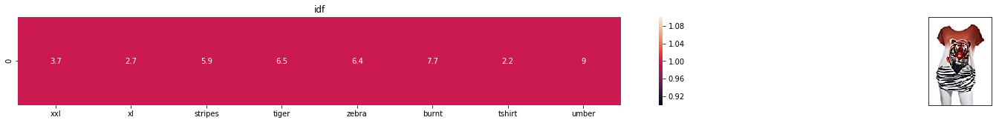

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from the given image : 0.0


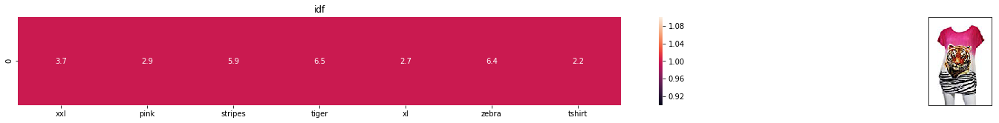

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from the given image : 12.20507131122177


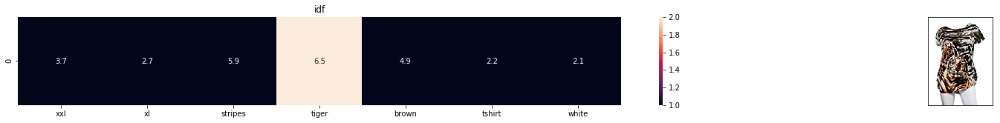

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from the given image : 14.468362685603465


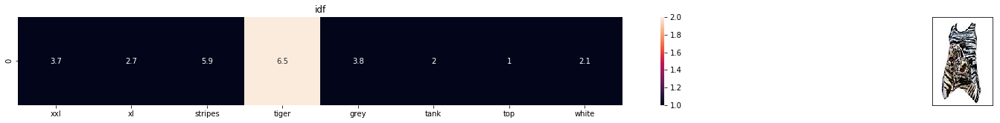

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from the given image : 14.486832924778964


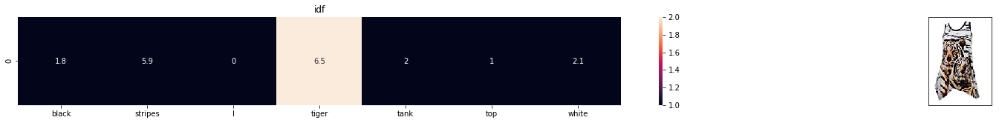

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from the given image : 14.833392966672909


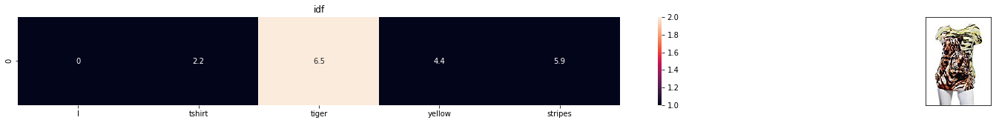

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from the given image : 14.898744516719225


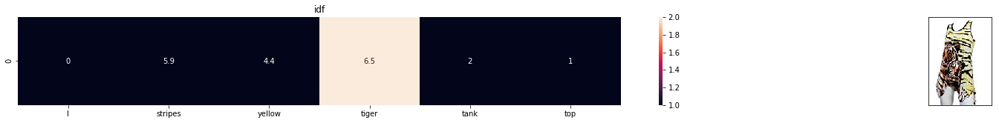

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from the given image : 15.224458287343769


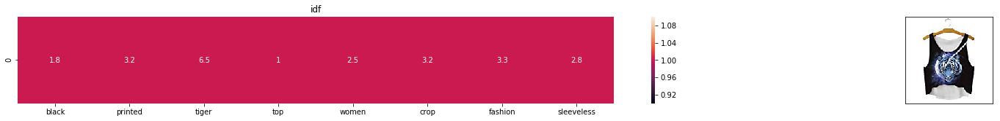

ASIN : B074T8ZYGX
Brand : MKP Crop Top
euclidean distance from the given image : 17.080812955631995


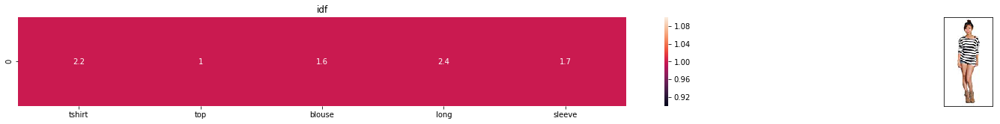

ASIN : B00KF2N5PU
Brand : Vietsbay
euclidean distance from the given image : 17.090168125645416


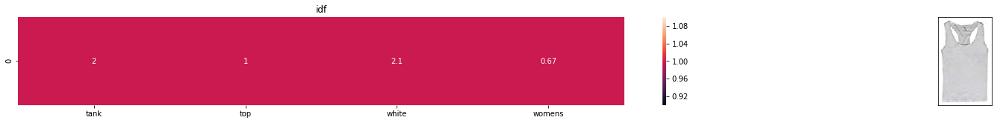

ASIN : B00JPOZ9GM
Brand : Sofra
euclidean distance from the given image : 17.153215337562703


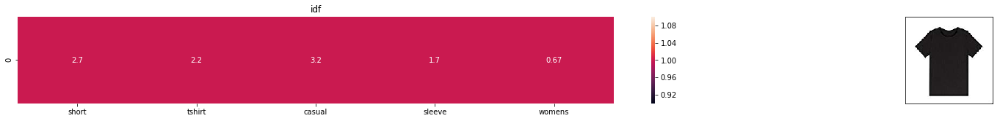

ASIN : B074T9KG9Q
Brand : Rain
euclidean distance from the given image : 17.33671523874989


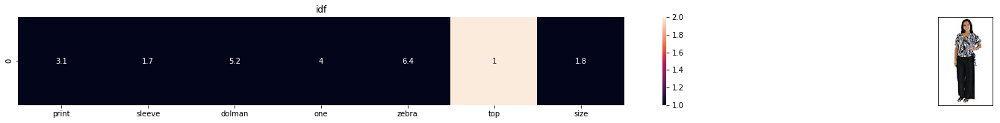

ASIN : B00H8A6ZLI
Brand : Vivian's Fashions
euclidean distance from the given image : 17.410075941001253


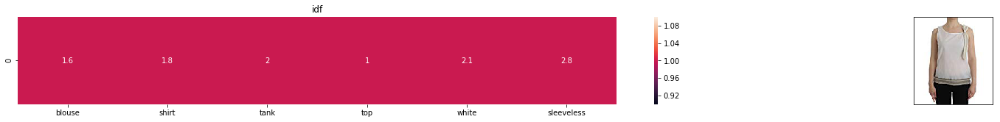

ASIN : B074G5G5RK
Brand : ERMANNO SCERVINO
euclidean distance from the given image : 17.539921335459557


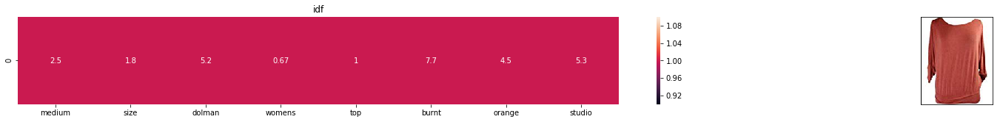

ASIN : B06XSCVFT5
Brand : Studio M
euclidean distance from the given image : 17.61275854366134


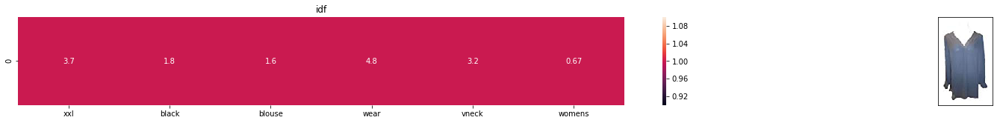

ASIN : B06Y6FH453
Brand : Who What Wear
euclidean distance from the given image : 17.623745282500135


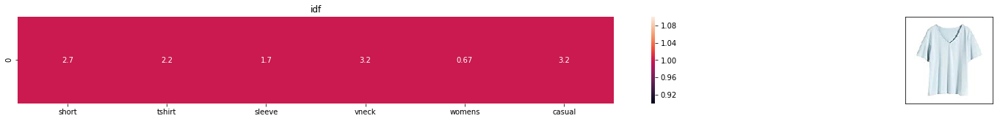

ASIN : B074V45DCX
Brand : Rain
euclidean distance from the given image : 17.634342496835046


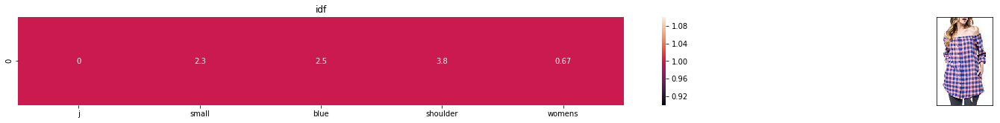

ASIN : B07583CQFT
Brand : Very J
euclidean distance from the given image : 17.63753712743611


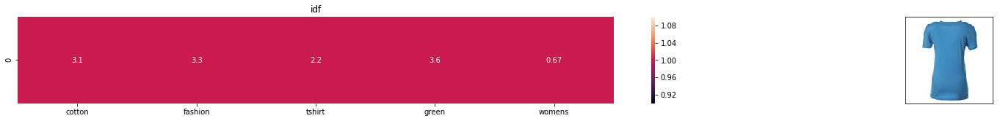

ASIN : B073GJGVBN
Brand : Ivan Levi
euclidean distance from the given image : 17.7230738913371


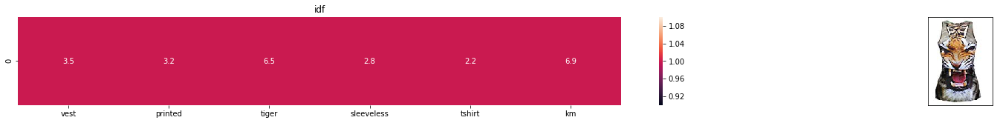

ASIN : B012VQLT6Y
Brand : KM T-shirt
euclidean distance from the given image : 17.762588561202364


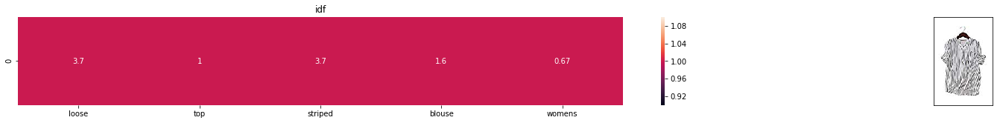

ASIN : B00ZZMYBRG
Brand : HP-LEISURE
euclidean distance from the given image : 17.779536864674238


In [21]:
def idf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(title_features, title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        
        # we will pass 1. doc_id, 2. text1, 3. text2, url, model
        get_result(doc_id = indices[i], text1 = data['title'].loc[df_indices[i]], text2 = data['title'].loc[df_indices[i]], 
                   url= data['medium_image_url'].loc[df_indices[i]], model = 'idf')
        
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)

        
idf_model(12566,20)
# in the output heat map each value represents the idf values of the label word, the color represents the intersection with inputs title

# Text Semantics based product similarity

In [34]:

# credits: https://www.kaggle.com/c/word2vec-nlp-tutorial#part-2-word-vectors
# Custom Word2Vec using your own text data.
# Do NOT RUN this code.
# It is meant as a reference to build your own Word2Vec when you have 
# lots of data.

'''
# Set values for various parameters
num_features = 300    # Word vector dimensionality                      
min_word_count = 1    # Minimum word count                        
num_workers = 4       # Number of threads to run in parallel
context = 10          # Context window size                                                                                    
downsampling = 1e-3   # Downsample setting for frequent words

# Initialize and train the model (this will take some time)
from gensim.models import word2vec
print ("Training model...")
model = word2vec.Word2Vec(sen_corpus, workers=num_workers, \
            size=num_features, min_count = min_word_count, \
            window = context)
    
'''

'\n# Set values for various parameters\nnum_features = 300    # Word vector dimensionality                      \nmin_word_count = 1    # Minimum word count                        \nnum_workers = 4       # Number of threads to run in parallel\ncontext = 10          # Context window size                                                                                    \ndownsampling = 1e-3   # Downsample setting for frequent words\n\n# Initialize and train the model (this will take some time)\nfrom gensim.models import word2vec\nprint ("Training model...")\nmodel = word2vec.Word2Vec(sen_corpus, workers=num_workers,             size=num_features, min_count = min_word_count,             window = context)\n    \n'

In [22]:
documents = []
for i in title:
    i = i.split(' ')
    documents.append(i)

In [23]:
print(documents[:2])

[['featherlite', 'ladies', 'long', 'sleeve', 'stain', 'resistant', 'tapered', 'twill', 'shirt', 'xl', 'onyx', 'black', 'stone'], ['women', 'unique', 'cotton', 'special', 'olympics', 'world', 'games', 'white', 'size']]


In [24]:
from datetime import datetime
start = datetime.now()

# created my own w2v
model = Word2Vec(sentences = documents, size= 300, workers= -1, min_count= 1, window= 10)
model.save('my_w2v')
print('Time taken to complete:', datetime.now() - start)

Time taken to complete: 0:00:03.063651


In [25]:
model.wv.most_similar('cotton')

[('emubody', 0.21017703413963318),
 ('salsa', 0.20395976305007935),
 ('mario', 0.1970212608575821),
 ('kenny', 0.19635352492332458),
 ('teeshirts', 0.19447043538093567),
 ('bolayu', 0.19408757984638214),
 ('aging', 0.193427175283432),
 ('whmaxim', 0.18705648183822632),
 ('vein', 0.1805715262889862),
 ('knee', 0.1771112084388733)]

In [33]:
model['cotton']

array([ 1.00866740e-03, -1.23850710e-03, -1.44440727e-03, -1.49043277e-03,
       -1.63399818e-04,  4.78729140e-04,  5.04741678e-04, -1.20654318e-03,
       -9.59158875e-04,  3.30711191e-04, -6.39937993e-04, -1.09524284e-04,
        1.48706068e-03,  8.23927912e-05, -7.51655258e-04,  1.11117610e-03,
       -1.48648644e-04,  1.39120338e-03, -1.02662237e-03, -5.81381493e-04,
        7.84754578e-04, -8.17759312e-04,  1.43714342e-03, -4.33089328e-04,
        1.50141132e-04, -1.12789450e-03,  3.72582668e-04,  1.59798132e-03,
        1.56117987e-03,  1.62043713e-03, -1.10386207e-03,  3.25770030e-04,
        3.08571267e-04, -1.52219227e-03,  4.35540715e-04,  1.46230287e-03,
        1.22204030e-04, -7.01479556e-04,  1.63738162e-03,  4.97273693e-04,
       -7.52991982e-05,  8.31437879e-04,  7.19406584e-04, -2.83711761e-05,
        2.65145703e-04, -1.20904238e-03,  1.60512188e-03, -7.19963864e-05,
        5.78926702e-04,  7.61619478e-04,  7.83096912e-05, -1.38436895e-04,
        9.22906736e-04,  

In [26]:
with open('word2vec_model', 'rb') as handle:
    model1 = pickle.load(handle)

In [32]:
model1['cotton']

array([ 5.54199219e-02,  8.54492188e-03, -3.24218750e-01,  2.00195312e-01,
        6.88476562e-02,  7.17773438e-02, -7.99560547e-03, -2.44140625e-01,
       -1.10351562e-01,  7.61718750e-02,  2.58789062e-02, -2.50000000e-01,
       -1.24023438e-01,  1.83593750e-01, -2.96875000e-01,  2.44140625e-01,
       -1.82617188e-01, -2.51770020e-04, -1.51367188e-01,  5.90820312e-02,
       -2.89062500e-01,  5.88378906e-02,  1.42578125e-01,  1.46484375e-01,
        8.05664062e-02,  1.38549805e-02, -1.12792969e-01, -8.98437500e-02,
        4.95605469e-02, -1.37695312e-01, -1.83593750e-01, -7.76367188e-02,
       -1.56250000e-01,  7.76367188e-02, -3.94531250e-01,  5.31250000e-01,
        8.64257812e-02, -3.89099121e-03,  1.24023438e-01,  1.83593750e-01,
       -4.71191406e-02,  4.04296875e-01,  5.00488281e-02, -1.60156250e-01,
       -7.22656250e-02, -3.94531250e-01, -6.74438477e-03, -1.14257812e-01,
        6.59179688e-02, -2.57812500e-01,  1.24511719e-01, -2.57812500e-01,
       -1.40625000e-01, -

In [34]:
# Utility functions

def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    
    # each row is a vector of length 300 corresponds to each word in give title
    # vec1 = np.array(#number_of_words_title1 * 300), 
    # vec2 = np.array(#number_of_words_title2 * 300), 
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [35]:
# vocab = stores all the words that are there in google w2v model
vocab = model.wv.vocab.keys() # if you are using Google word2Vec or own w2v

# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

# Average Word2Vec product similarity.

In [36]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)


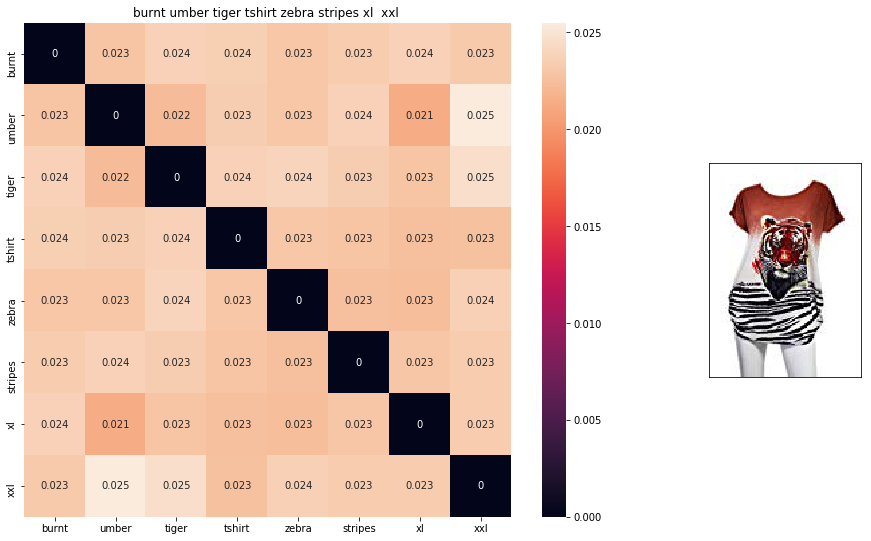

ASIN : B00JXQB5FQ
BRAND : Si Row
euclidean distance from given input image : 0.0


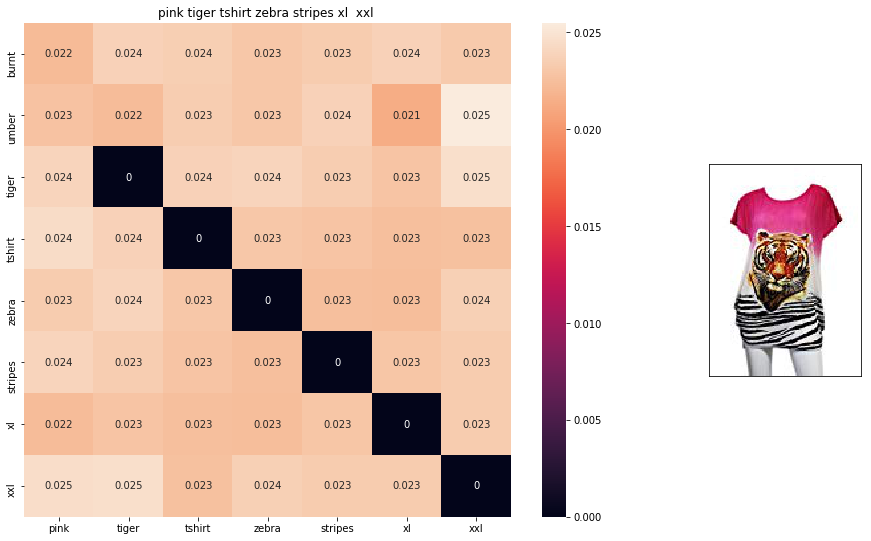

ASIN : B00JXQASS6
BRAND : Si Row
euclidean distance from given input image : 0.0036580856


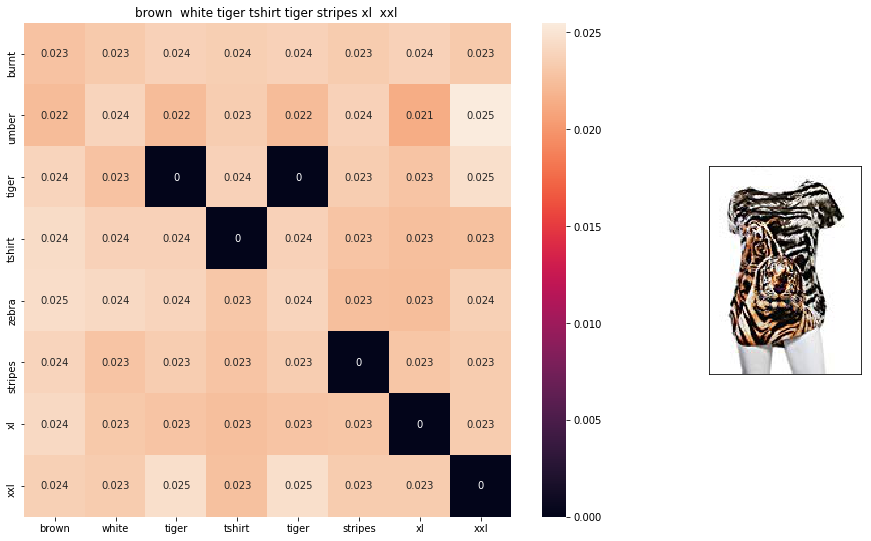

ASIN : B00JXQCWTO
BRAND : Si Row
euclidean distance from given input image : 0.0052268975


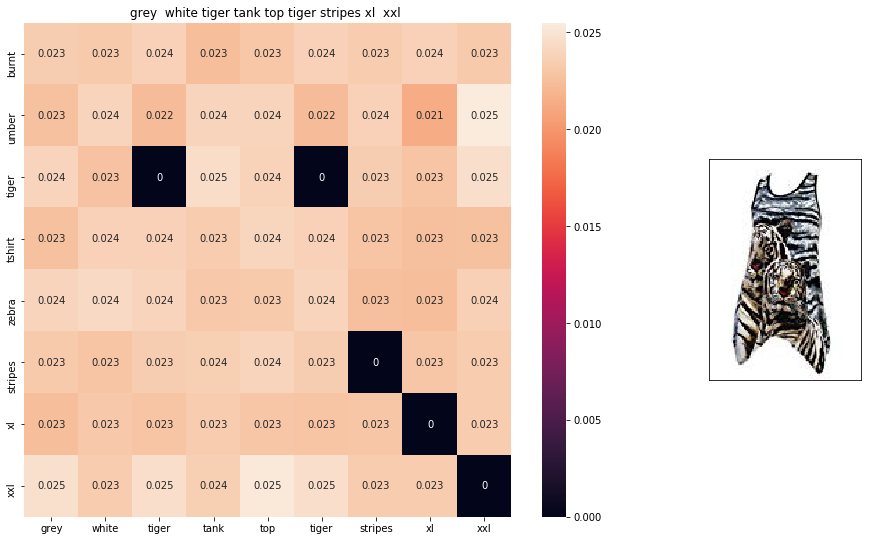

ASIN : B00JXQAFZ2
BRAND : Si Row
euclidean distance from given input image : 0.0060189506


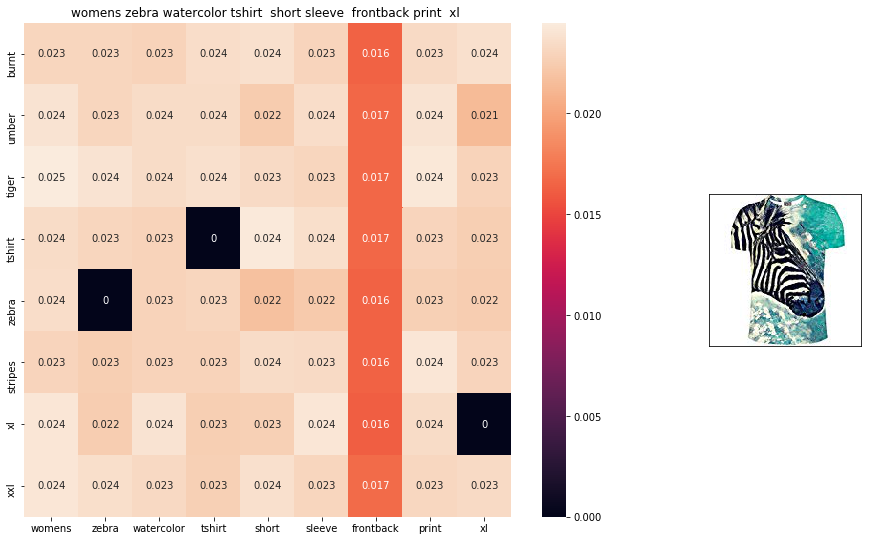

ASIN : B072R2JXKW
BRAND : WHAT ON EARTH
euclidean distance from given input image : 0.0061102156


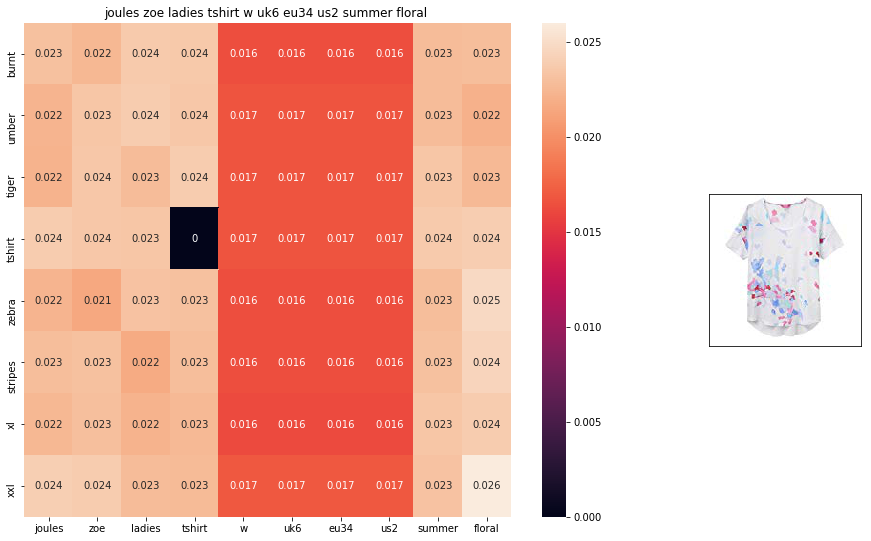

ASIN : B06XX36N5D
BRAND : Joules
euclidean distance from given input image : 0.0061238515


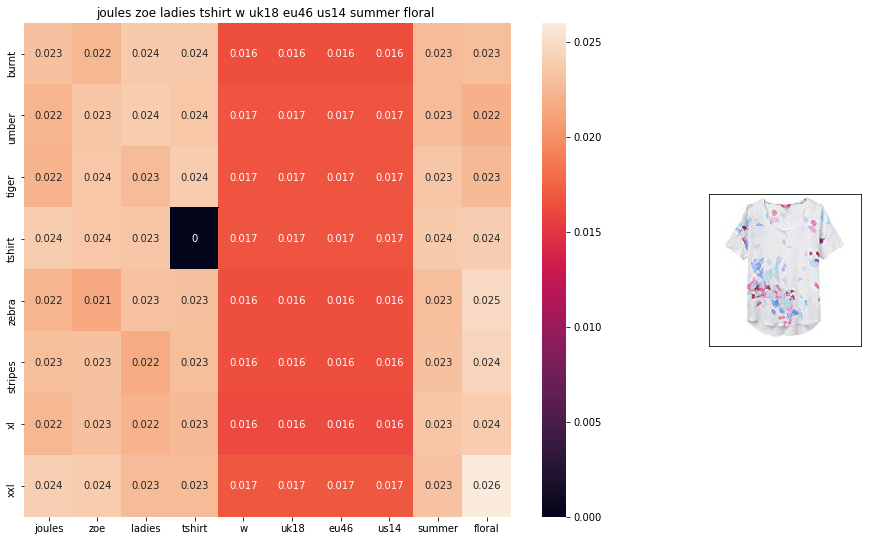

ASIN : B06XXK7NPH
BRAND : Joules
euclidean distance from given input image : 0.0061238515


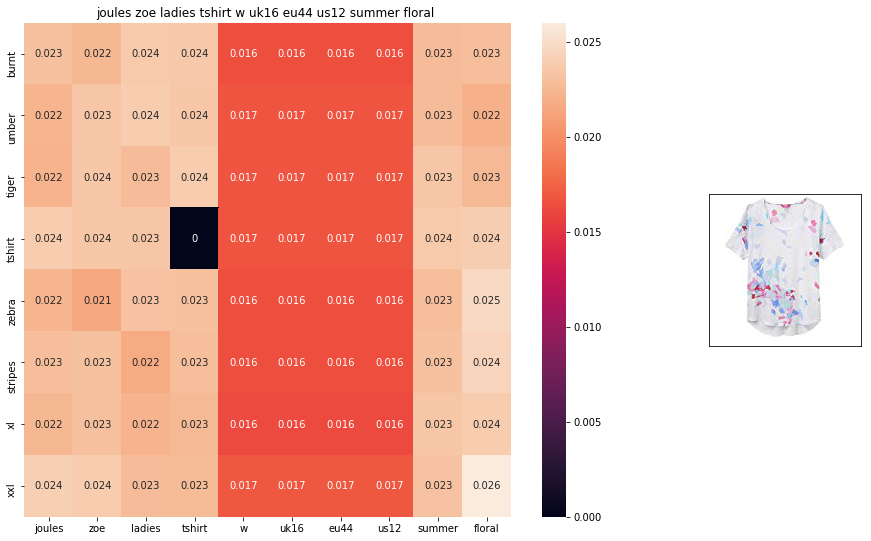

ASIN : B06XX36MSS
BRAND : Joules
euclidean distance from given input image : 0.0061238515


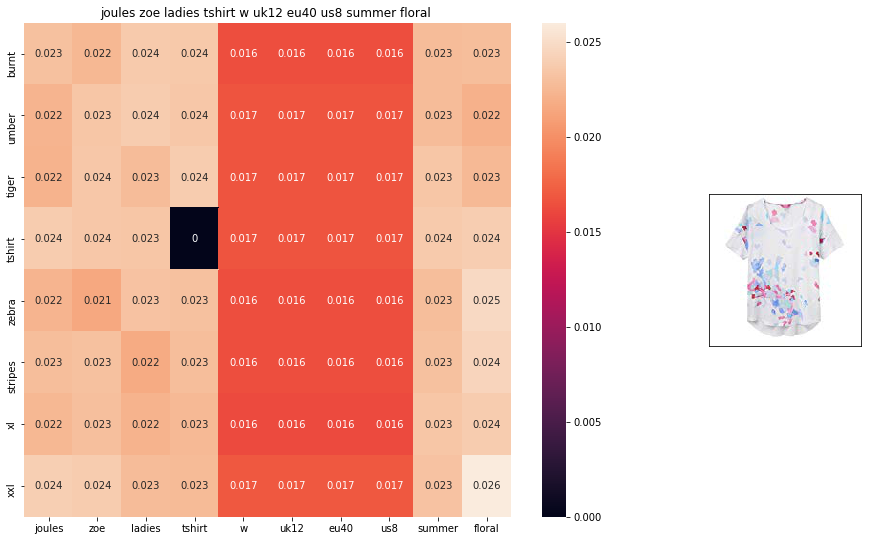

ASIN : B06XXH7B5X
BRAND : Joules
euclidean distance from given input image : 0.0061238515


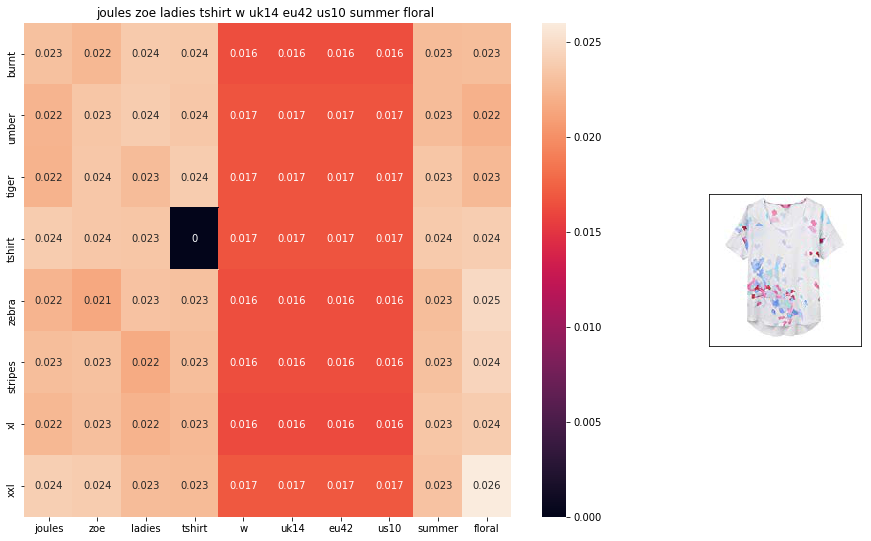

ASIN : B06XXJ2RQ4
BRAND : Joules
euclidean distance from given input image : 0.0061238515


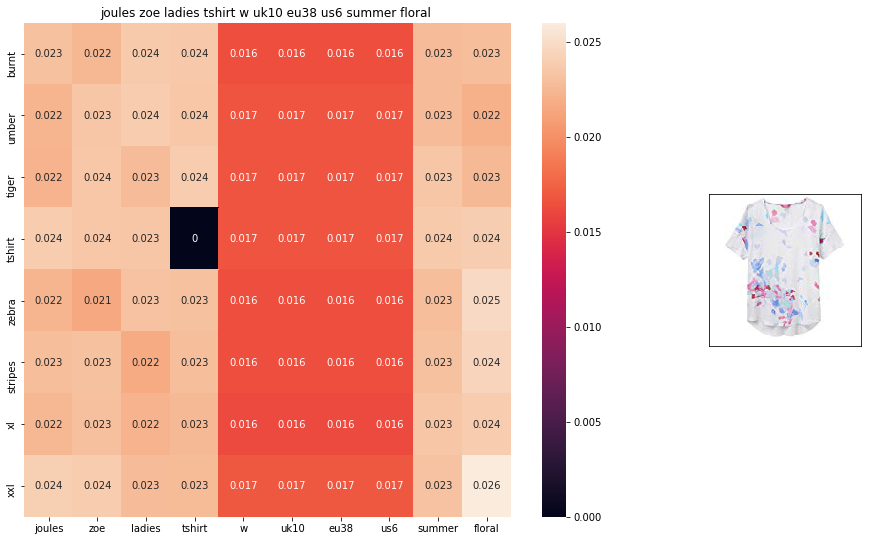

ASIN : B06XX9TS88
BRAND : Joules
euclidean distance from given input image : 0.0061238515


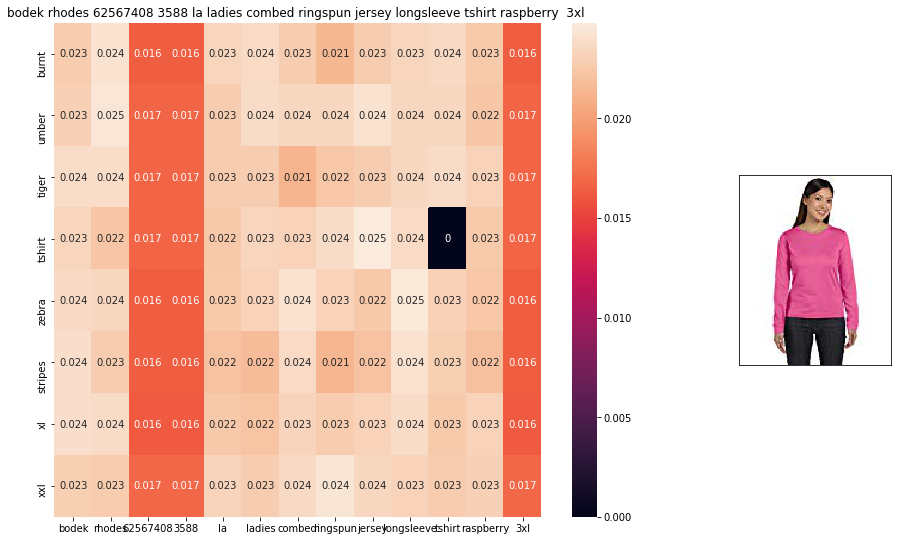

ASIN : B00305JUQW
BRAND : LAT Apparel
euclidean distance from given input image : 0.0061364165


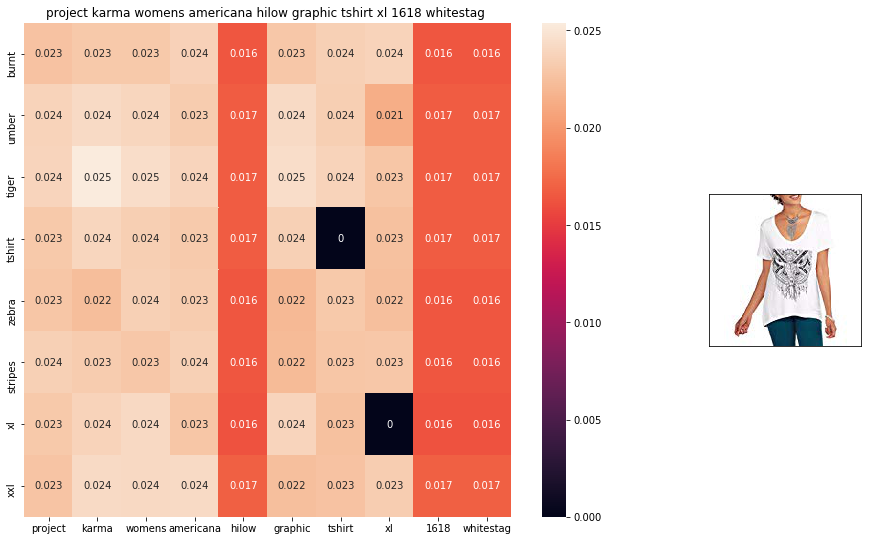

ASIN : B06XZM7W3C
BRAND : Project Karma
euclidean distance from given input image : 0.0062264293


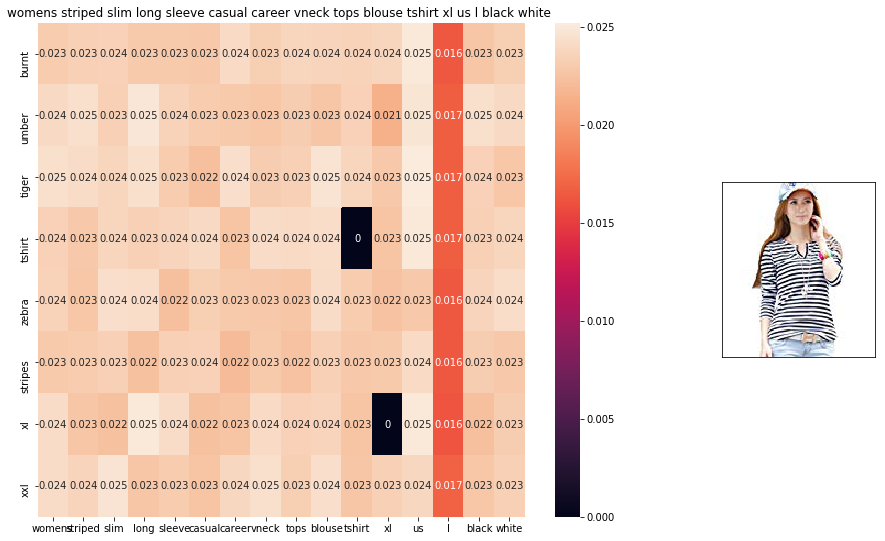

ASIN : B00MTHH2PS
BRAND : ACEFAST INC
euclidean distance from given input image : 0.006247882


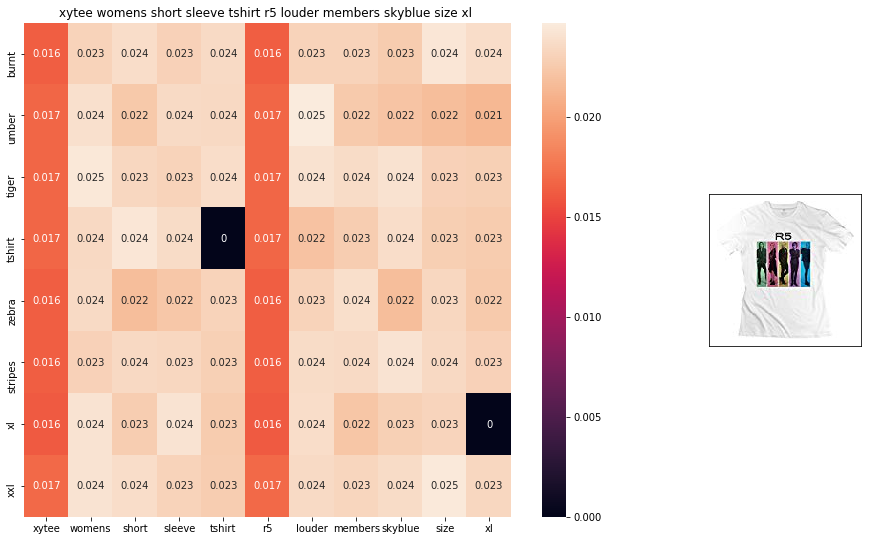

ASIN : B010H45ZMQ
BRAND : YX-Tee Fashion Design
euclidean distance from given input image : 0.006259412


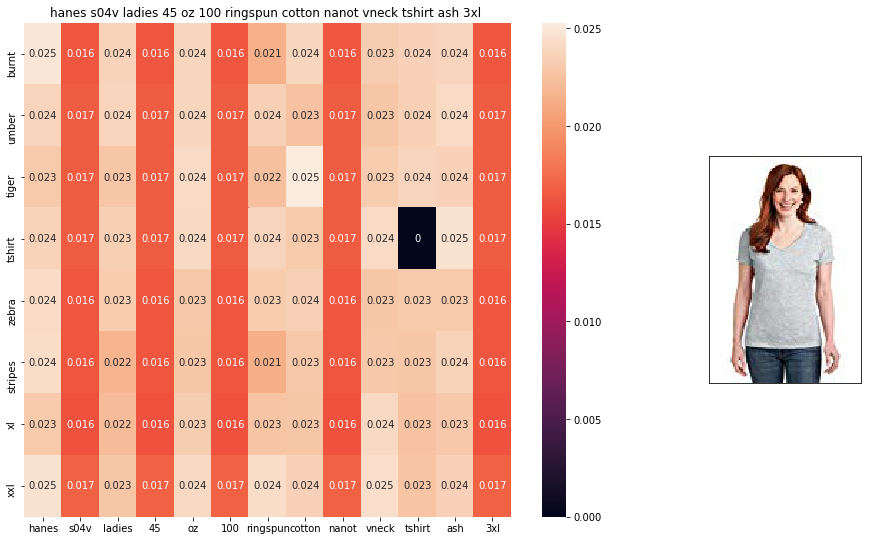

ASIN : B0159CM0X8
BRAND : Hanes
euclidean distance from given input image : 0.0062913797


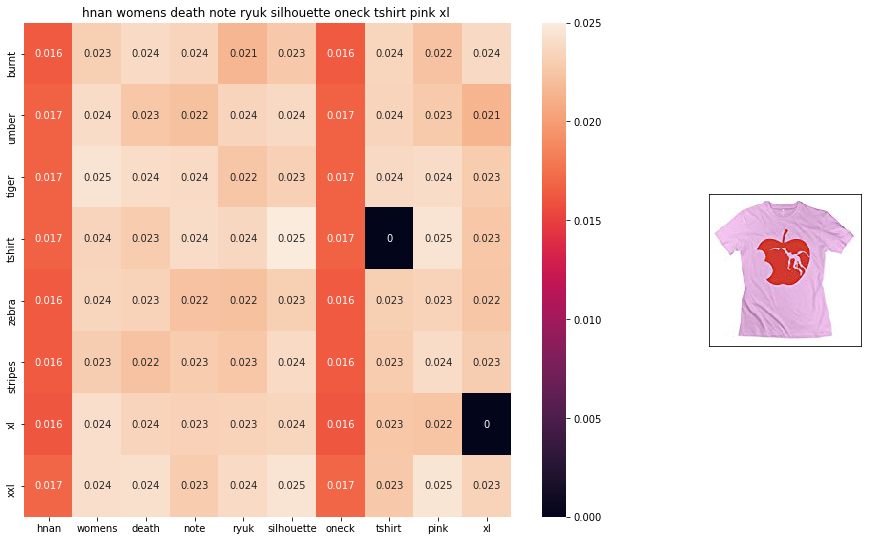

ASIN : B011I80ET4
BRAND : H'nan
euclidean distance from given input image : 0.006293522


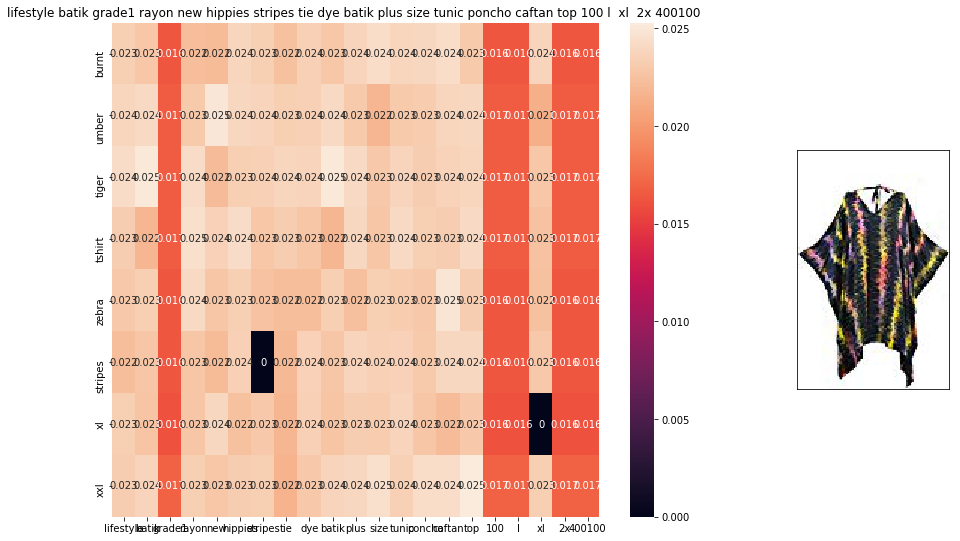

ASIN : B01N7V5ETV
BRAND : Lifestyle Batik
euclidean distance from given input image : 0.006297564


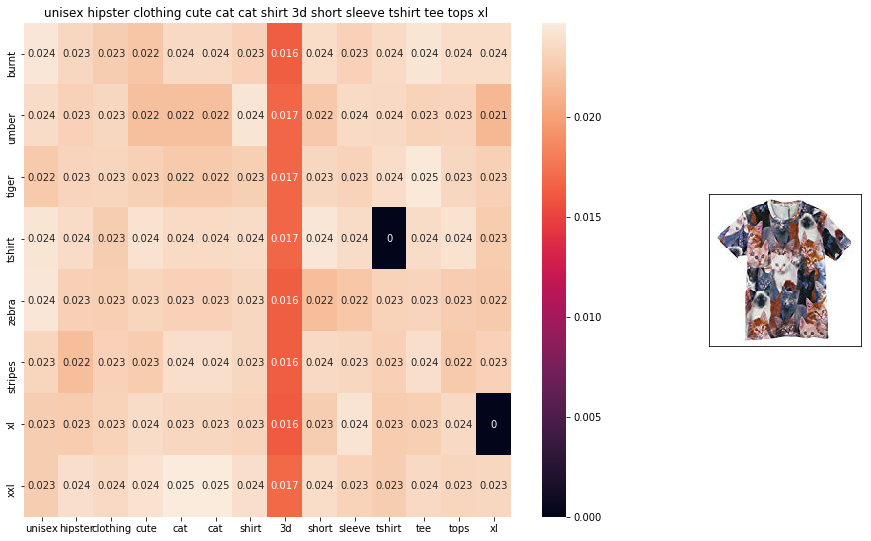

ASIN : B00OM4EF60
BRAND : Moji
euclidean distance from given input image : 0.006336969


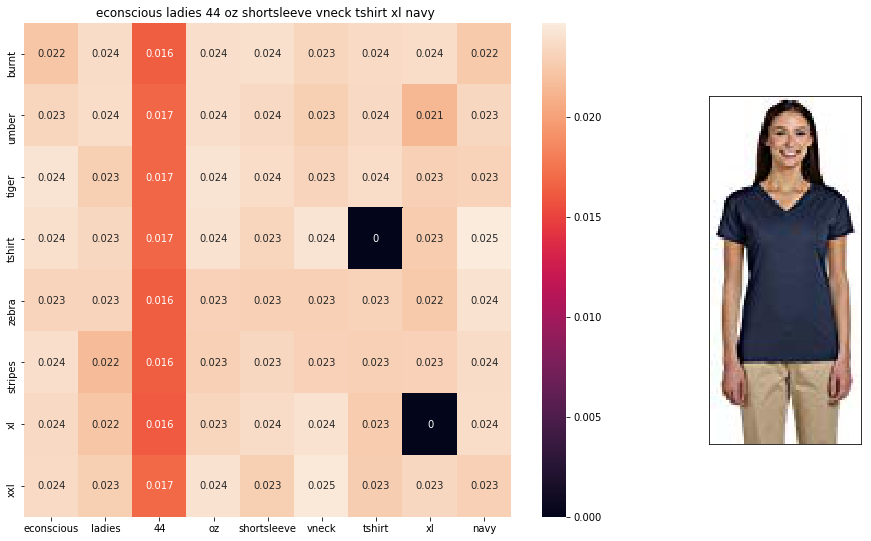

ASIN : B00VZDFOOS
BRAND : econscious
euclidean distance from given input image : 0.0063537485


In [37]:
def avg_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # dist(x, y) = sqrt(dot(x, x) - 2 * dot(x, y) + dot(y, y))
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'avg')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from given input image :', pdists[i])
        print('='*125)

        
avg_w2v_model(12566, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

#  IDF weighted Word2Vec for product similarity

In [38]:
w2v_title_weight = []

# for every title we build a weighted vector representation
doc_id = 0
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1

    # w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

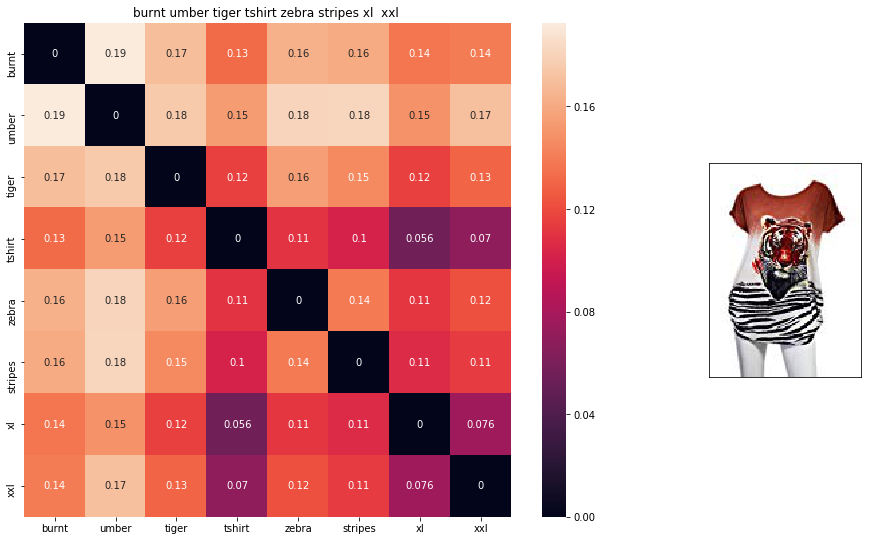

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.0


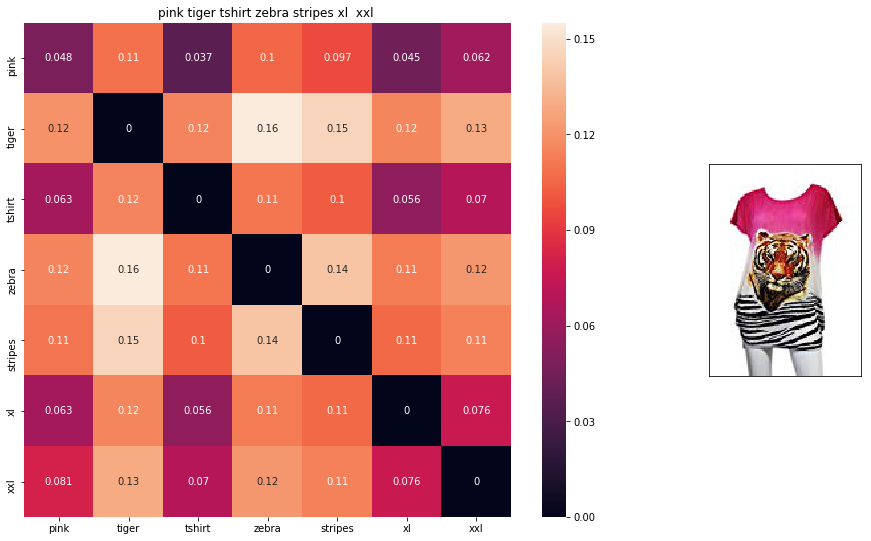

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 0.025327655


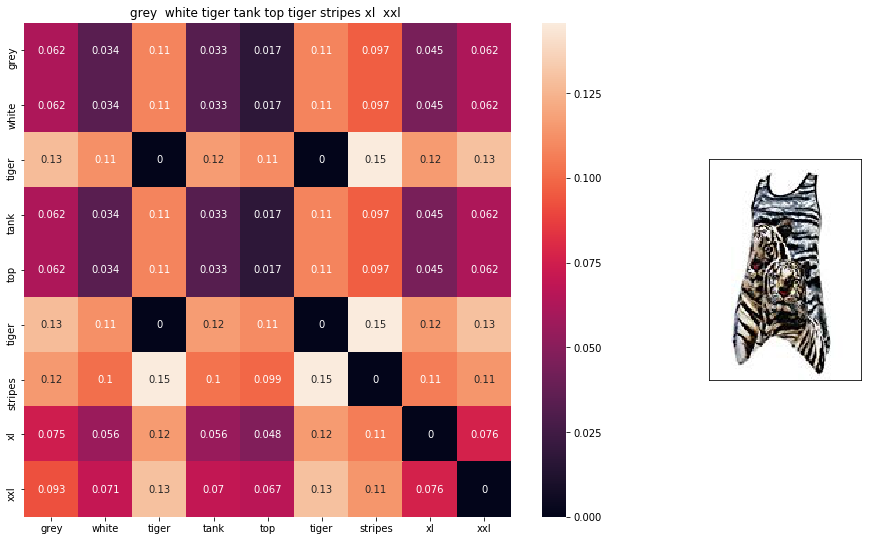

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 0.03207512


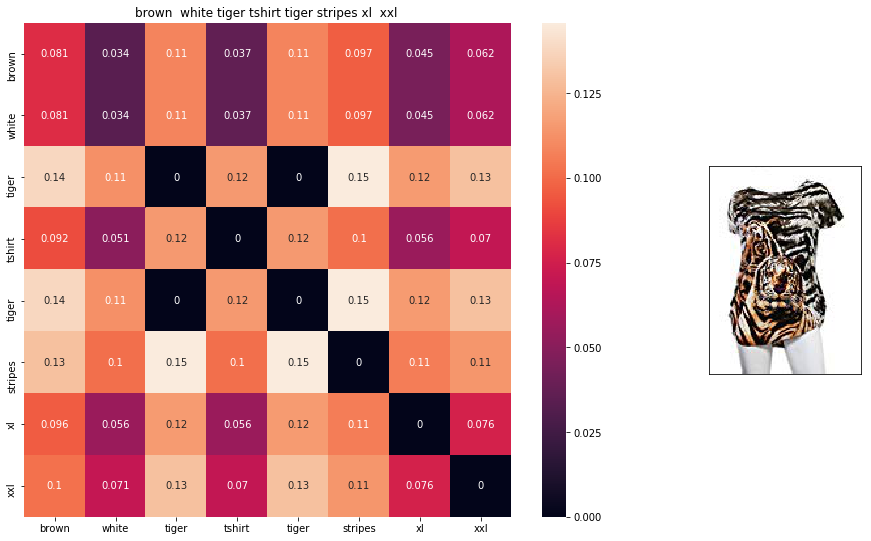

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 0.033051528


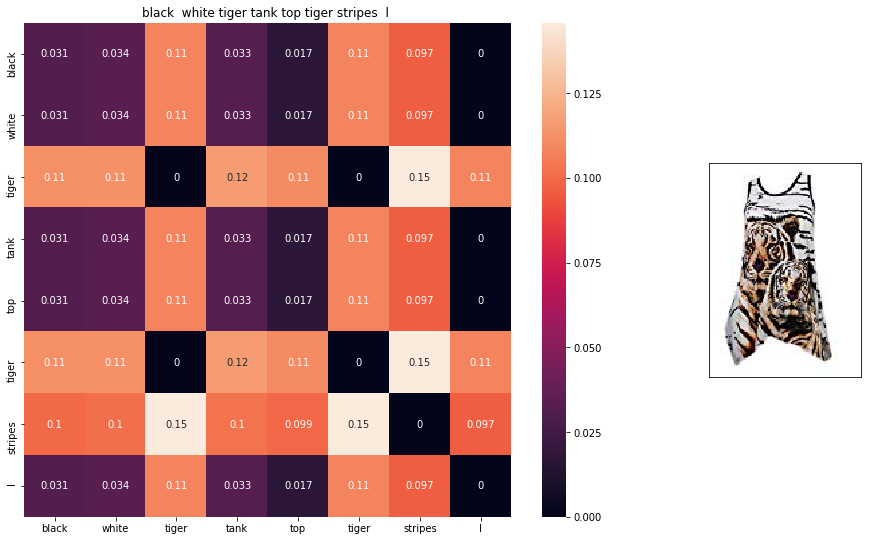

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 0.034209024


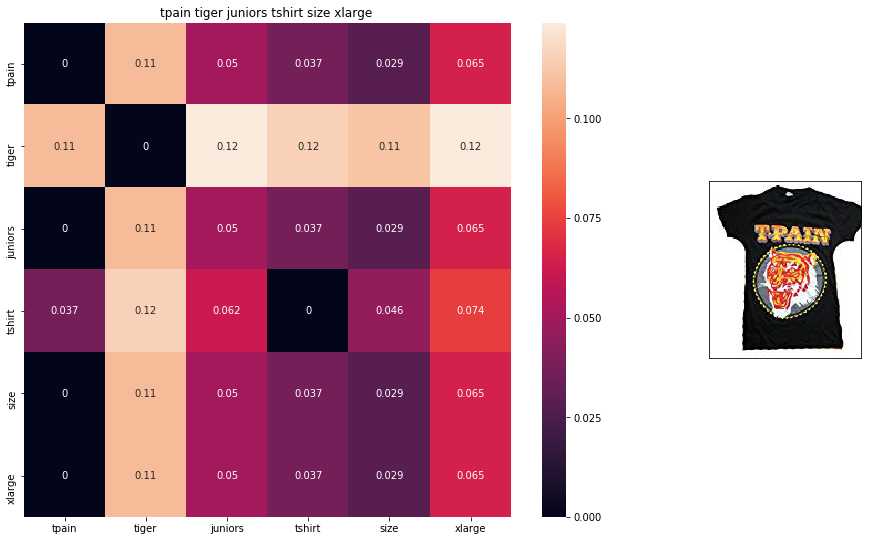

ASIN : B01K0H02OG
Brand : Tultex
euclidean distance from input : 0.034465414


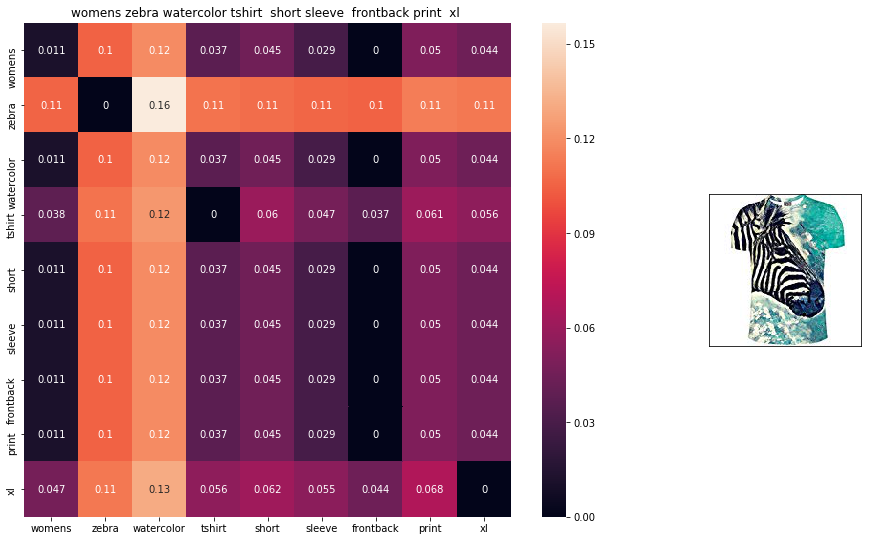

ASIN : B072R2JXKW
Brand : WHAT ON EARTH
euclidean distance from input : 0.0350316


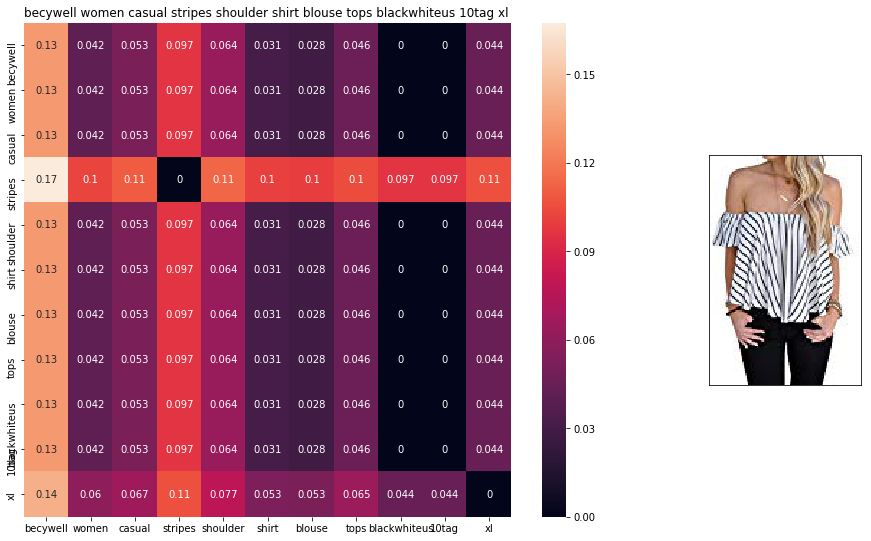

ASIN : B06XTBZBK9
Brand : BecyWell
euclidean distance from input : 0.035070907


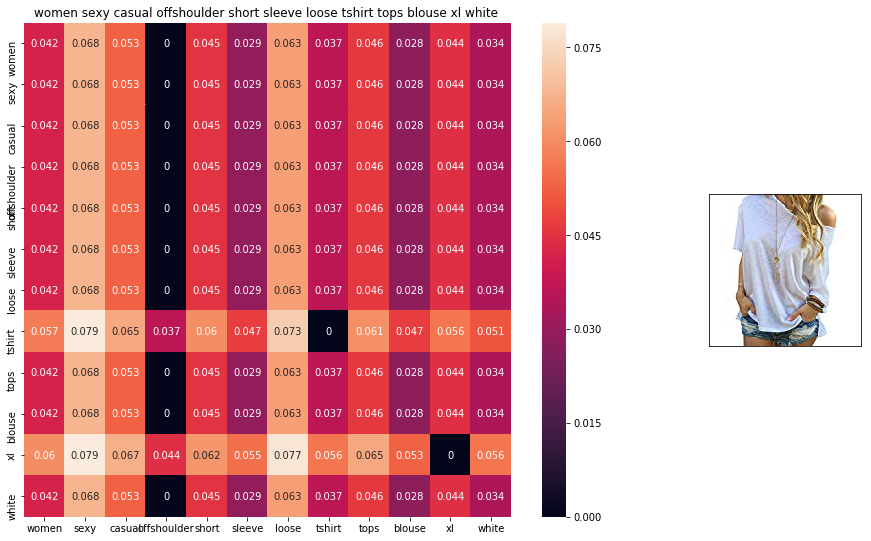

ASIN : B01FM379LW
Brand : Cutecc
euclidean distance from input : 0.03565619


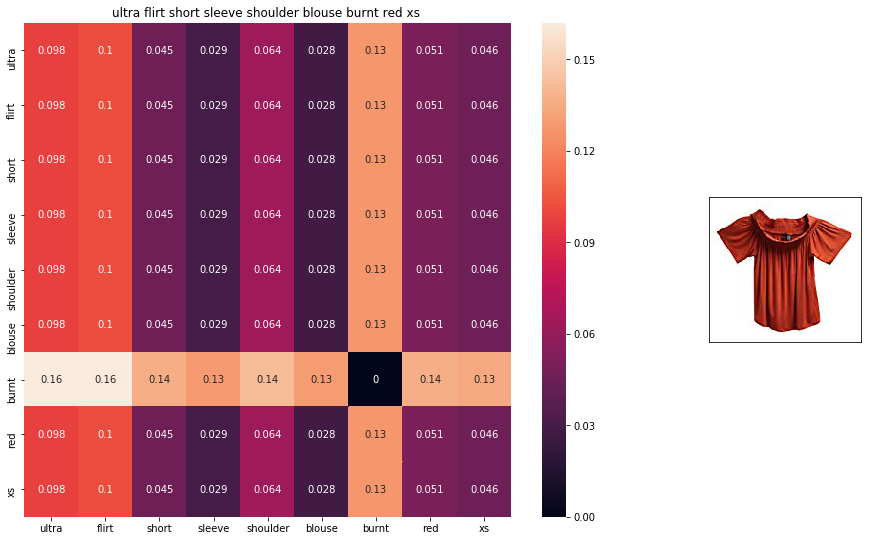

ASIN : B074TR12BH
Brand : Ultra Flirt
euclidean distance from input : 0.035690565


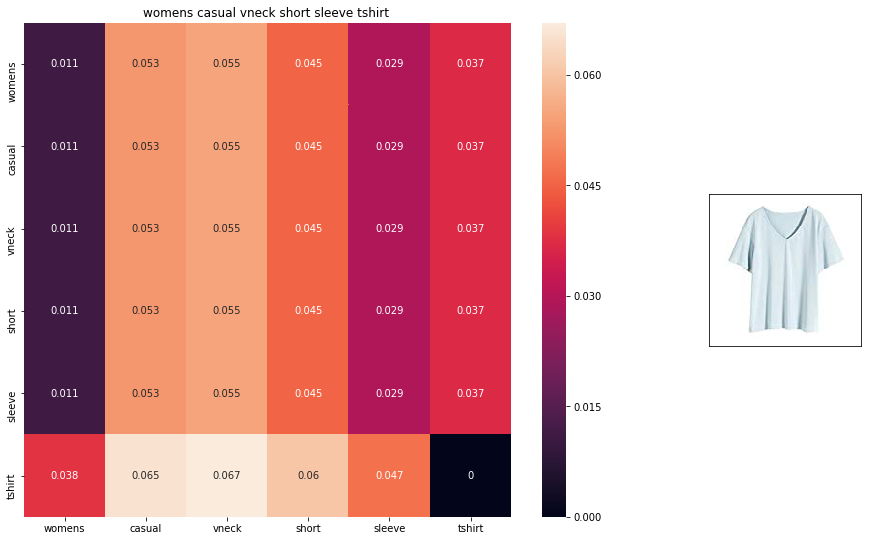

ASIN : B074V45DCX
Brand : Rain
euclidean distance from input : 0.035806853


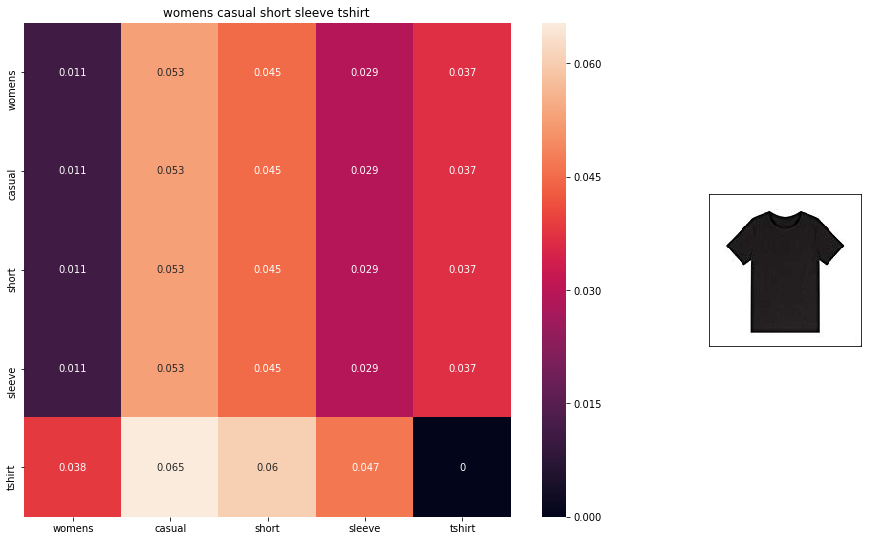

ASIN : B074T9KG9Q
Brand : Rain
euclidean distance from input : 0.03583672


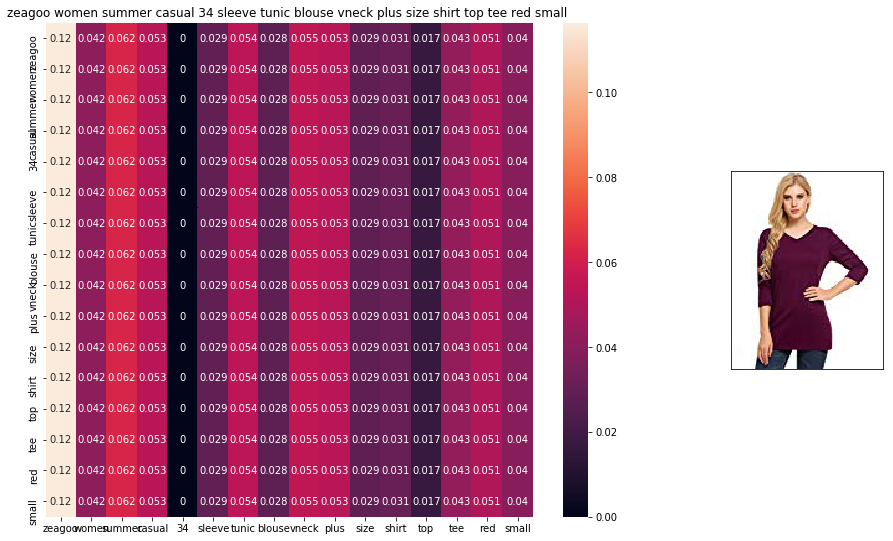

ASIN : B0725RCTLT
Brand : Zeagoo
euclidean distance from input : 0.035882644


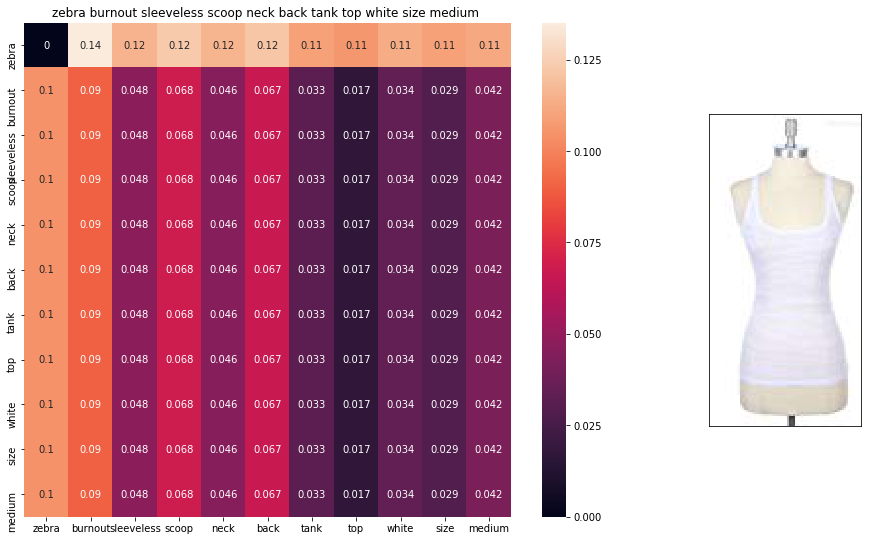

ASIN : B06XGYTZ49
Brand : Concert
euclidean distance from input : 0.03590636


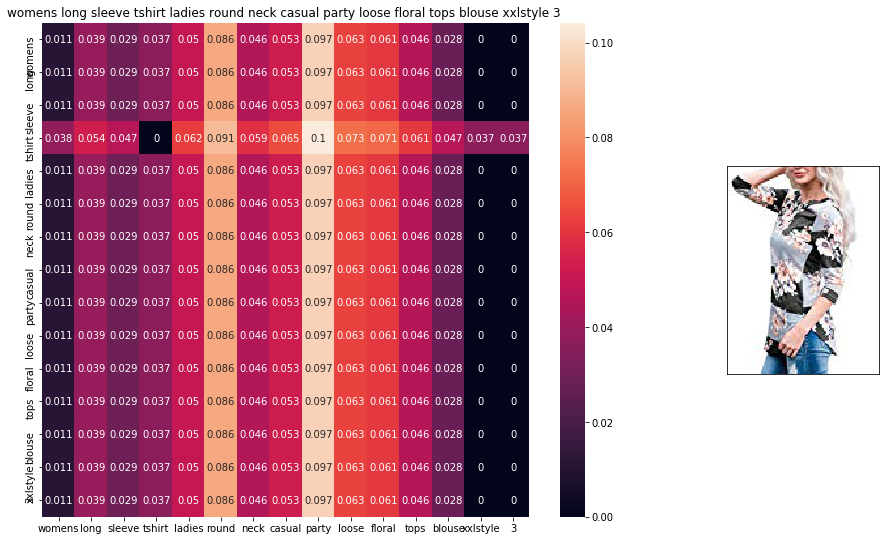

ASIN : B0756YKY75
Brand : Lantch
euclidean distance from input : 0.035909567


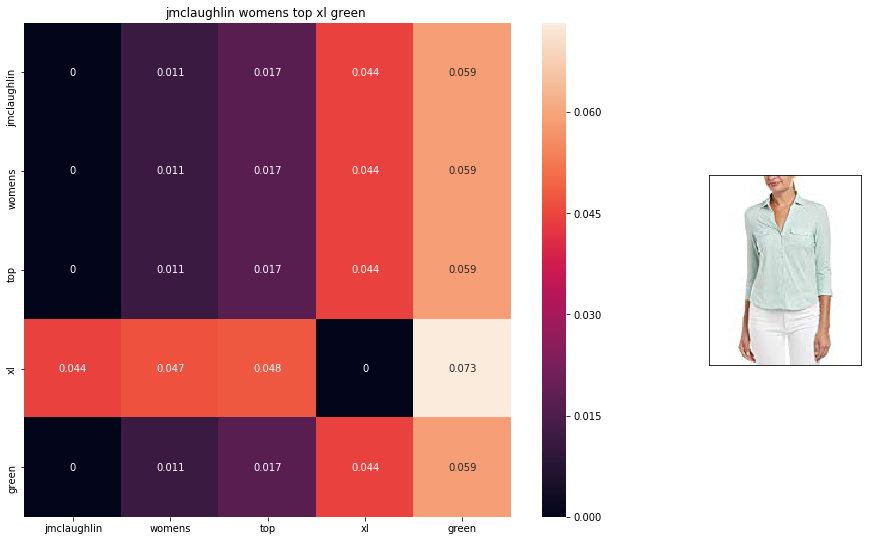

ASIN : B074KPDKMY
Brand : J. McLaughlin
euclidean distance from input : 0.035926726


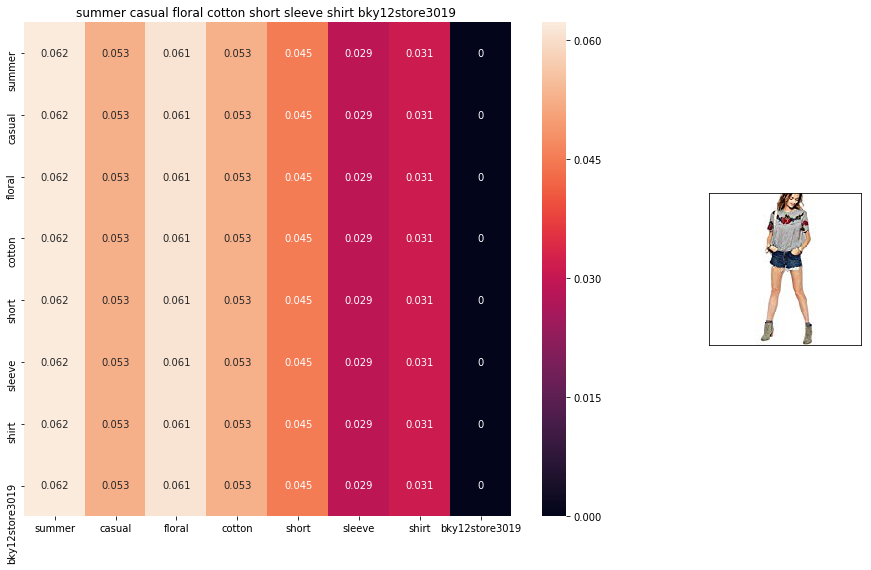

ASIN : B015LV4N3W
Brand : bankhunyabangyai store
euclidean distance from input : 0.035972614


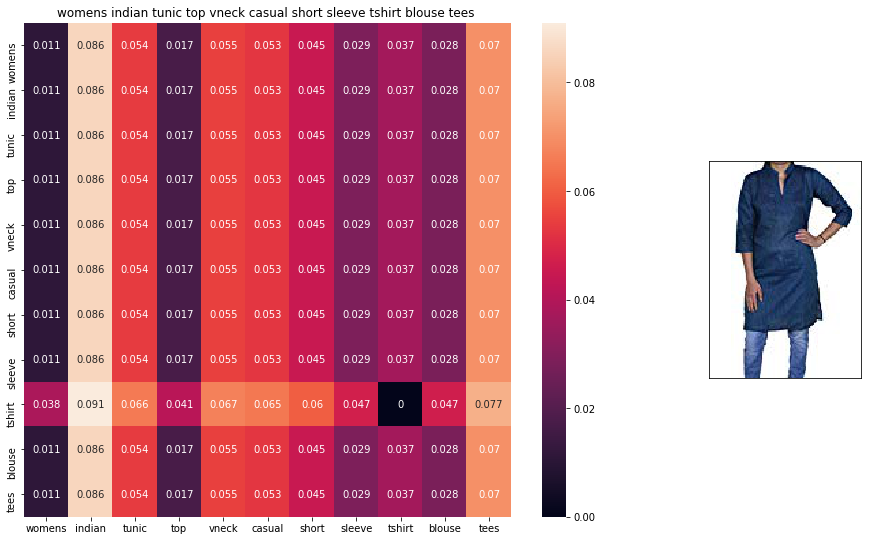

ASIN : B01HGQNI2C
Brand : RoyaltyLane
euclidean distance from input : 0.035998806


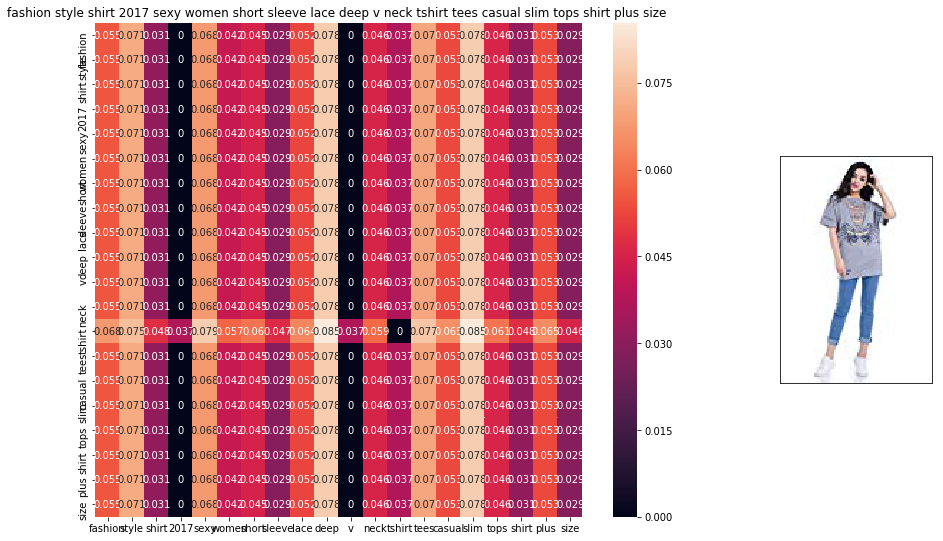

ASIN : B01MS2NG40
Brand : LHS Charmer
euclidean distance from input : 0.036032557


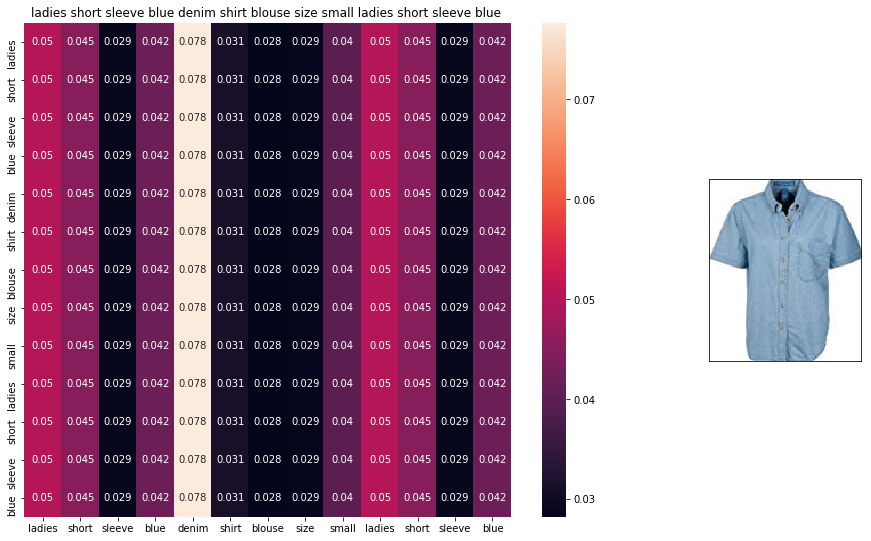

ASIN : B00GQ3N070
Brand : Harvard Square
euclidean distance from input : 0.036065996


In [39]:
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        heat_map_w2v(data['title'].loc[df_indices[i]],data['title'].loc[df_indices[i]], 
                     data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

weighted_w2v_model(12566, 20)
#931
#12566
# in the give heat map, each cell contains the euclidean distance between words i, j

# Weighted similarity using brand and color

In [40]:
data['brand'][:5]

4                     FeatherLite
6     HX-Kingdom Fashion T-shirts
15                    FeatherLite
27                          FNC7C
46                   Fifth Degree
Name: brand, dtype: object

In [41]:
data['color'][:5]

4     Onyx Black/ Stone
6                 White
15                White
27               Purple
46                Black
Name: color, dtype: object

In [42]:
data.head(2)

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99


In [43]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [74]:
def heat_map_w2v_brand(sentence1, sentence2, url, doc_id1, doc_id2, index1, index2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # index1: index of document1 in the data frame
    # index2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    # s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to 
    # each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    # s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to 
    # each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[index1], brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[index2], brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax1.set_title(sentence2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

In [47]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id]) # 3 items [brand + type(shirt/top) + color]
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[i]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)


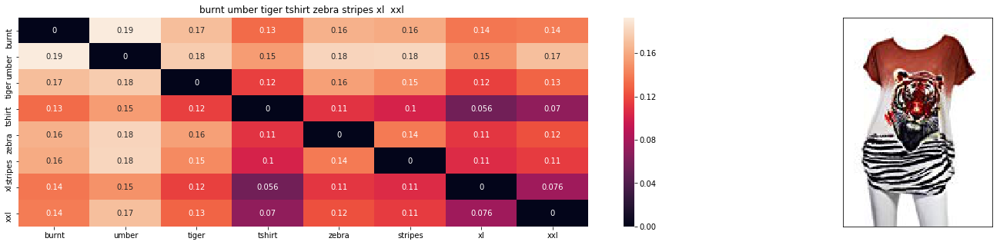

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.0


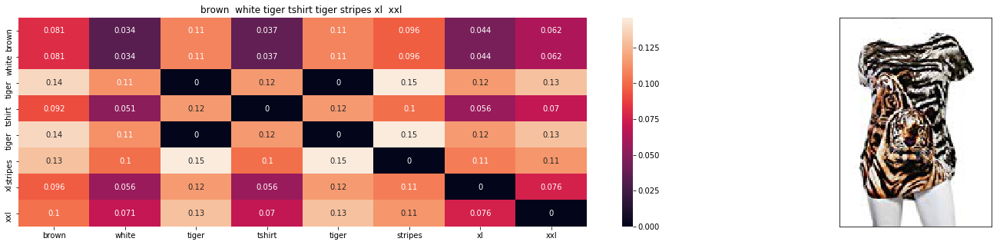

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 0.016525763273239135


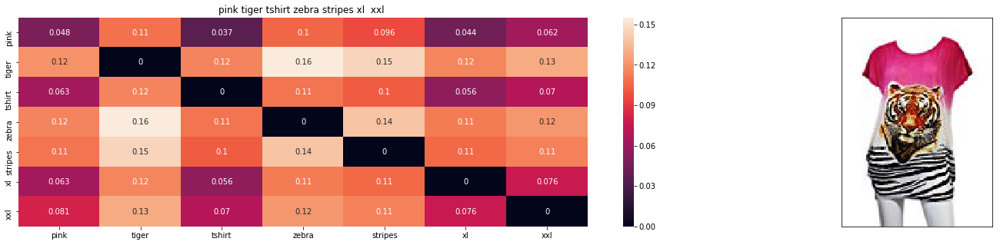

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 0.7197706090230611


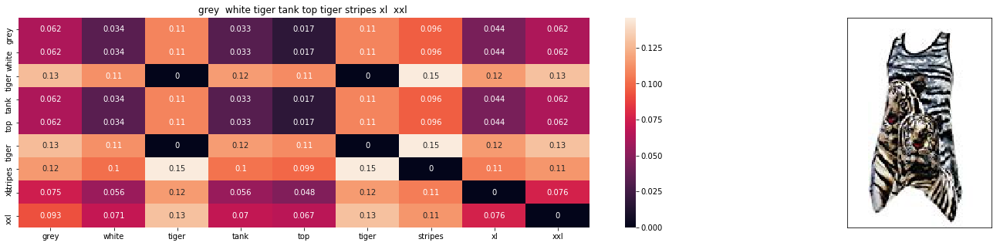

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 0.7231443406958249


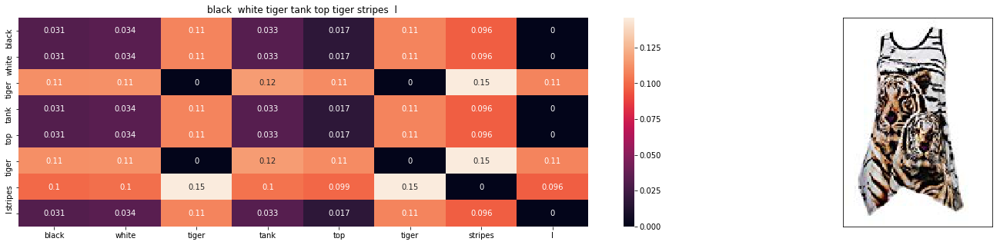

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 0.7242112936396268


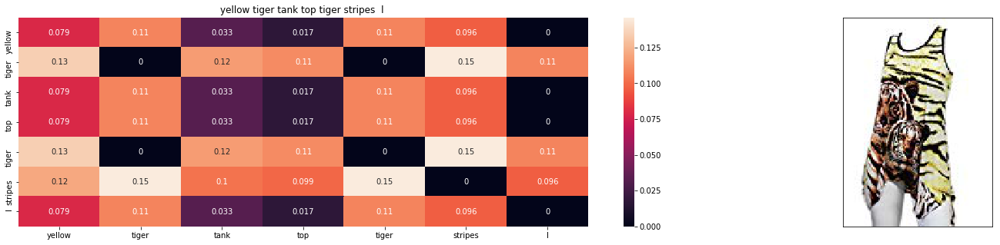

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 0.7260055066961911


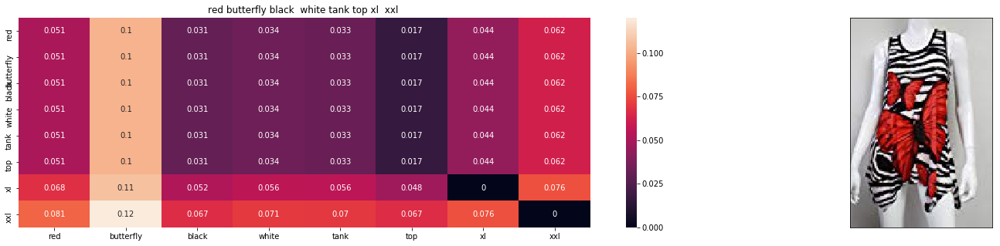

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 0.7264828177113202


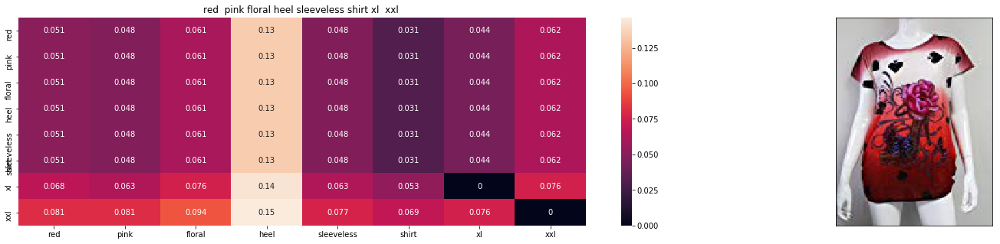

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 0.7269022421855595


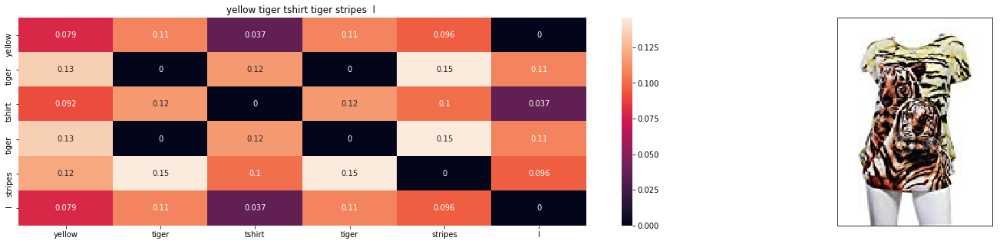

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 0.727330441953626


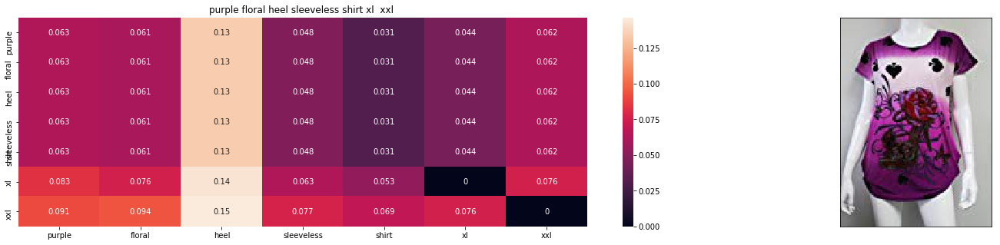

ASIN : B00JV63VC8
Brand : Si Row
euclidean distance from input : 0.7274598719496396


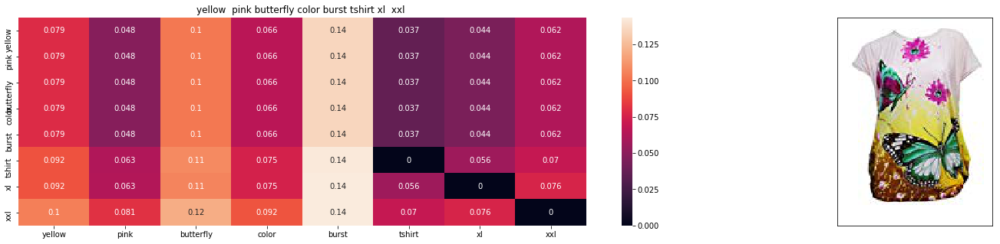

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 0.7290827276129391


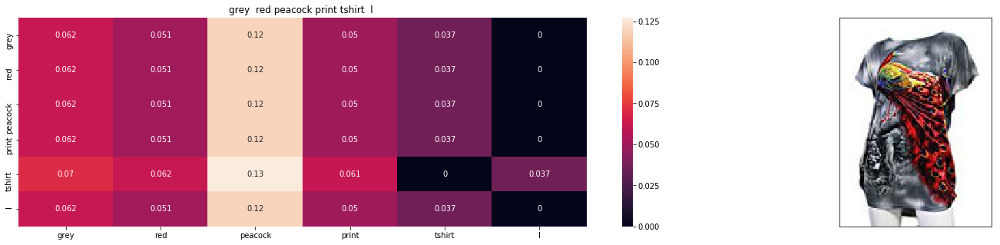

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 0.7293194295782712


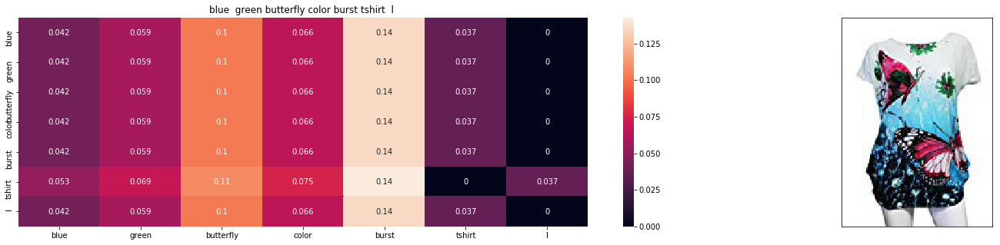

ASIN : B00JXQC0C8
Brand : Si Row
euclidean distance from input : 0.7296441884655621


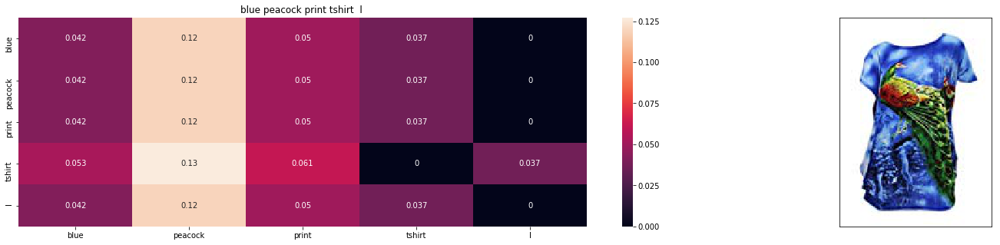

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 0.7298231931347516


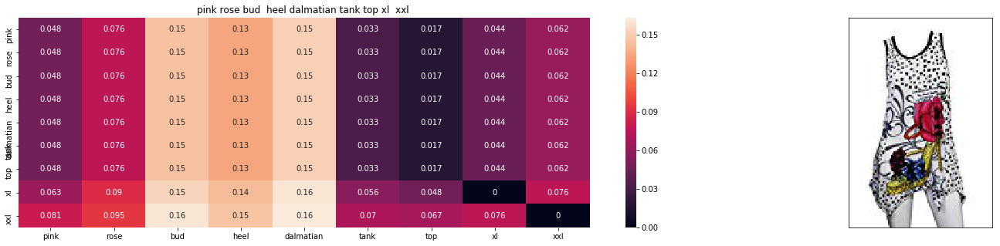

ASIN : B00JXQAX2C
Brand : Si Row
euclidean distance from input : 0.7303723754305509


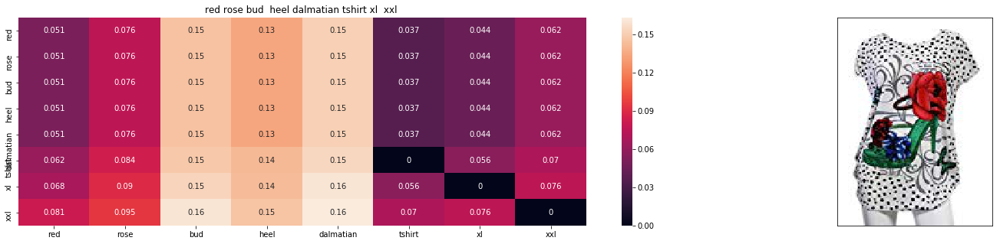

ASIN : B00JXQABB0
Brand : Si Row
euclidean distance from input : 0.7317152710575726


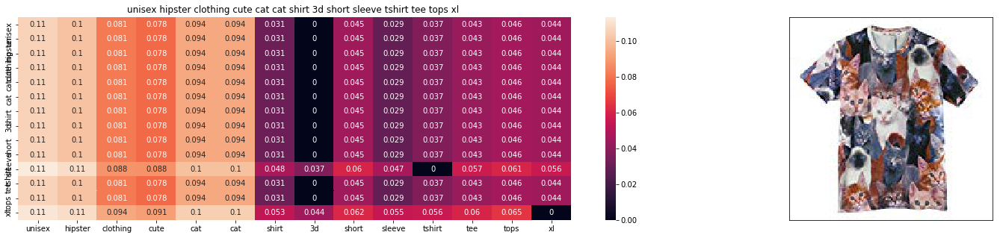

ASIN : B00OM4EF60
Brand : Moji
euclidean distance from input : 1.1366373359917734


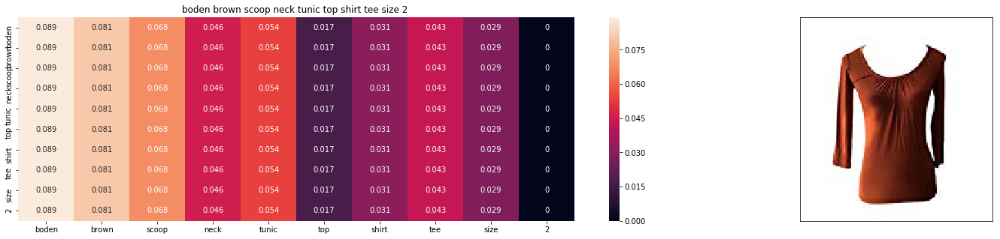

ASIN : B0718ZFSY7
Brand : BODEN
euclidean distance from input : 1.1371593430399034


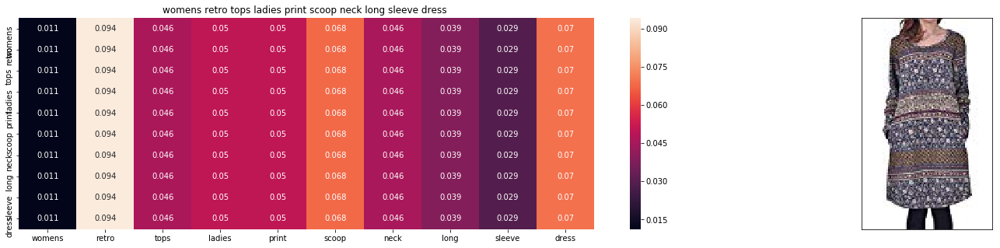

ASIN : B00NQR7GY2
Brand : Thenice
euclidean distance from input : 1.1371911465882394


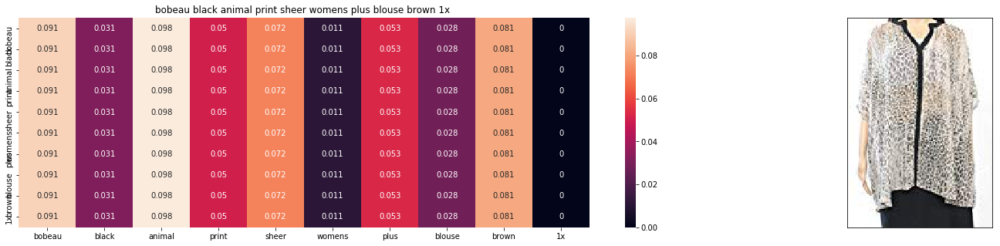

ASIN : B074MH886R
Brand : Bobeau
euclidean distance from input : 1.1373099744080637


In [50]:
# same imp to 'idf' and '[brand + type(shirt/top) + color]'
idf_w2v_brand(12566, 5, 5, 20) 
# in the give heat map, each cell contains the euclidean distance between words i, j

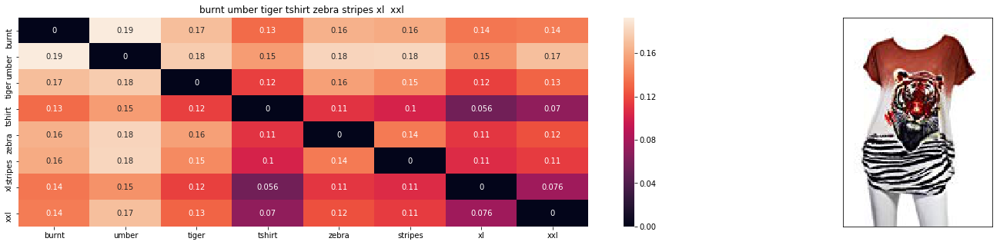

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.0


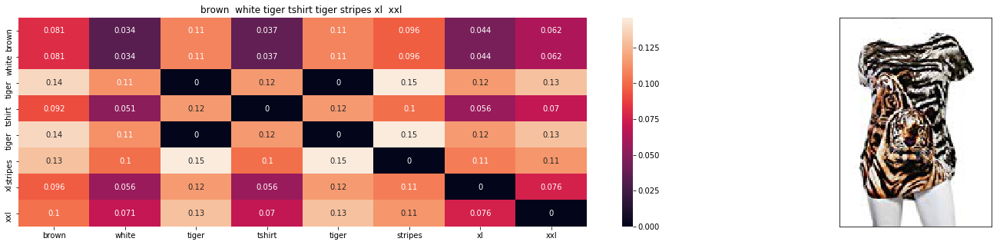

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 0.003004684231498025


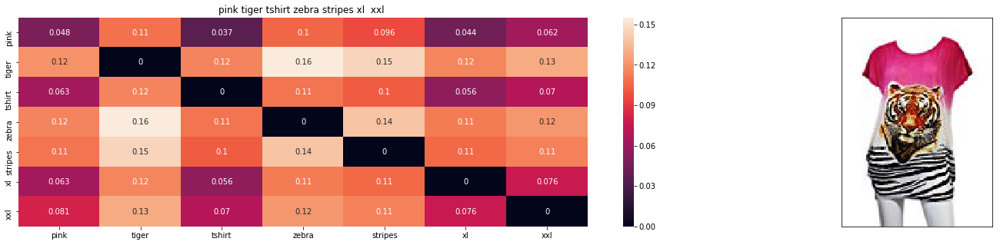

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 1.2879512072185435


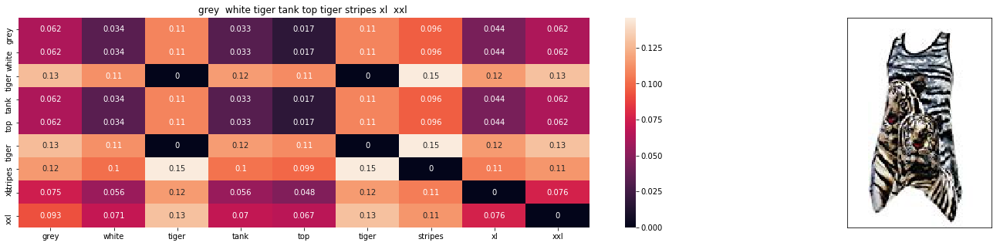

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 1.2885646129772277


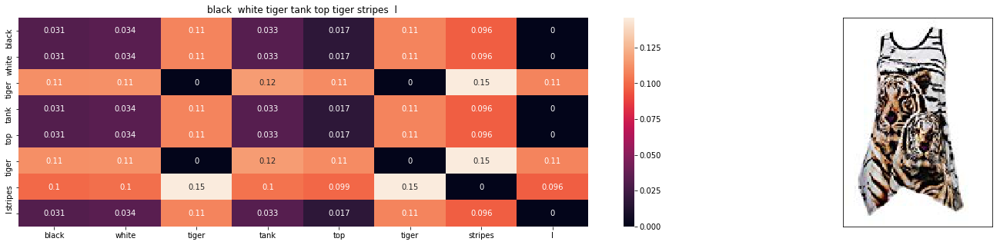

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 1.2887586044215553


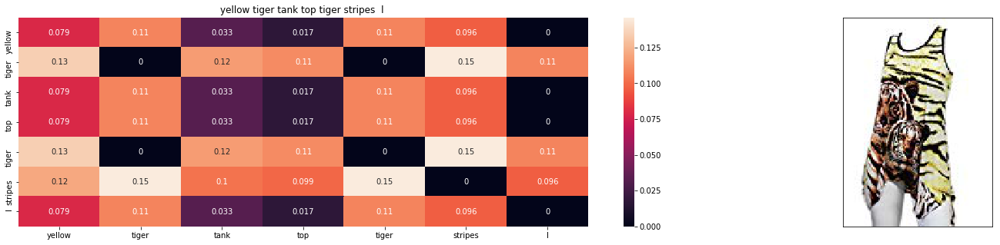

ASIN : B00JXQAUWA
Brand : Si Row
euclidean distance from input : 1.2890848249772944


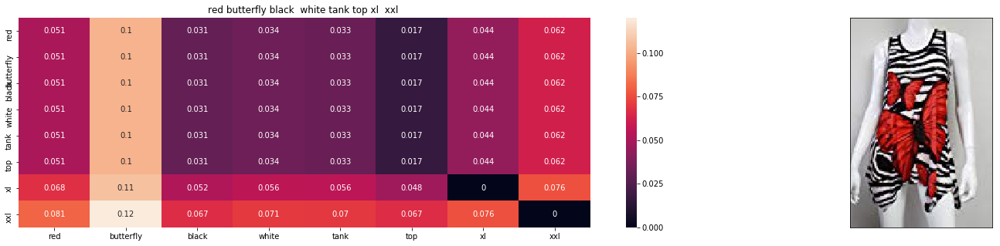

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 1.289171608798227


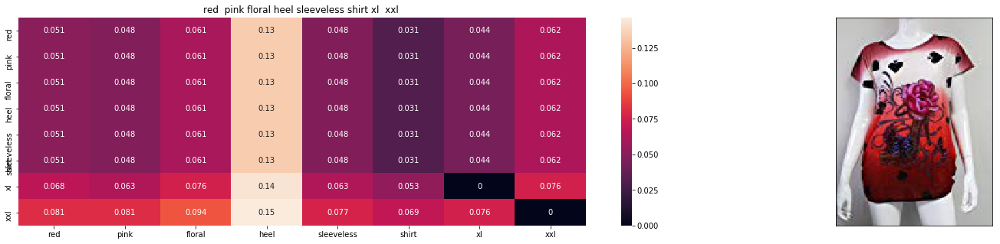

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 1.2892478677935433


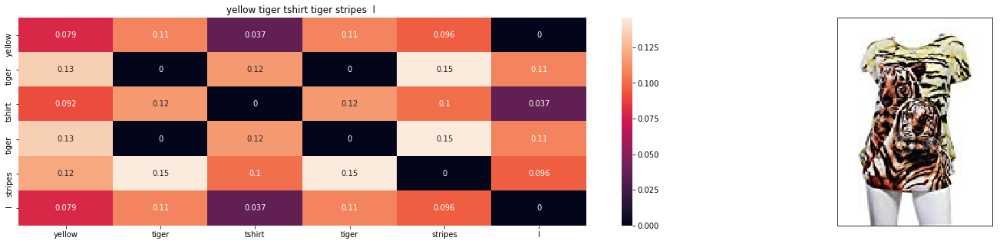

ASIN : B00JXQCUIC
Brand : Si Row
euclidean distance from input : 1.289325722296828


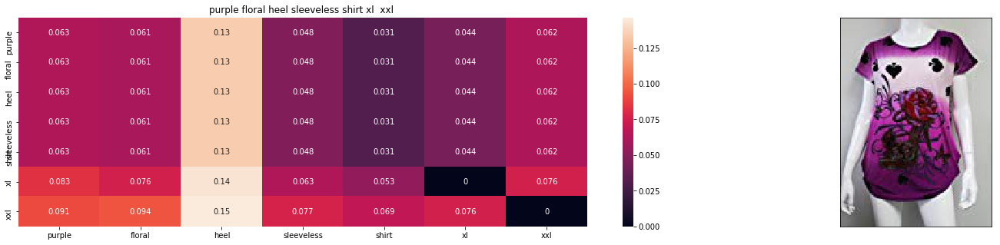

ASIN : B00JV63VC8
Brand : Si Row
euclidean distance from input : 1.2893492550233758


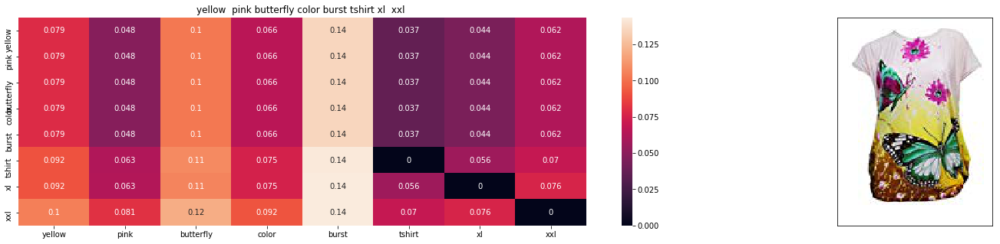

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 1.2896443196894303


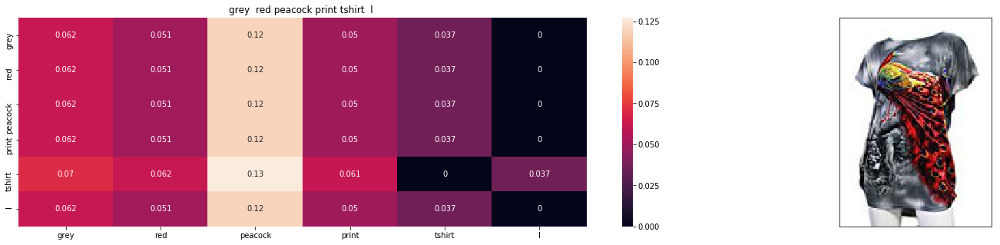

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 1.2896873564103999


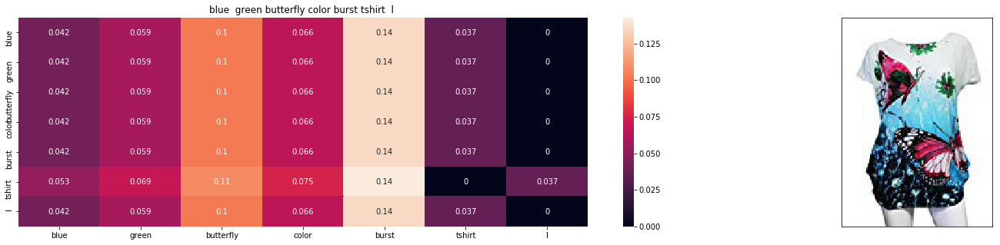

ASIN : B00JXQC0C8
Brand : Si Row
euclidean distance from input : 1.2897464034808164


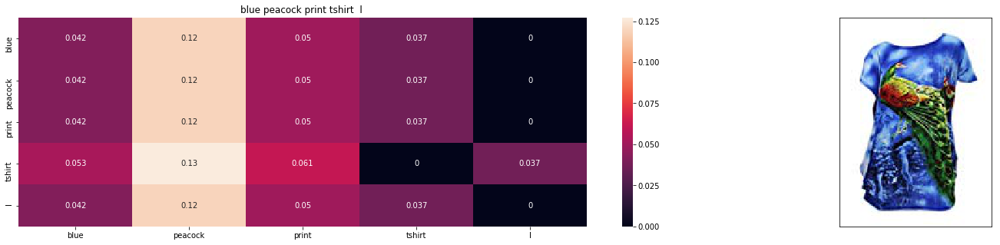

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 1.2897789497843053


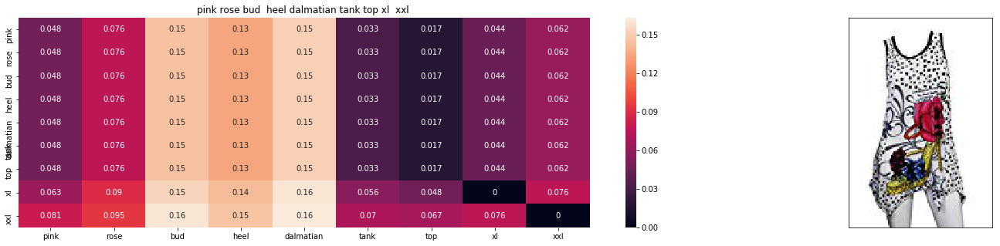

ASIN : B00JXQAX2C
Brand : Si Row
euclidean distance from input : 1.2898788011108144


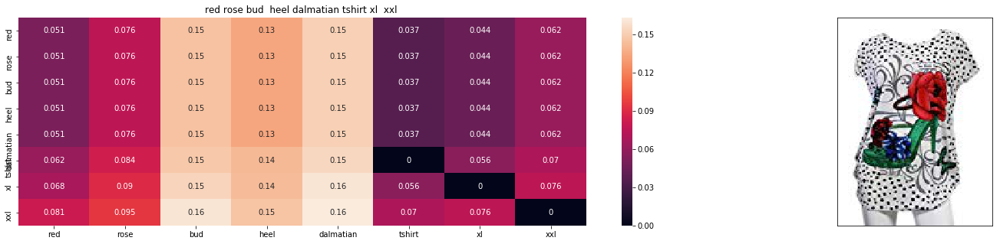

ASIN : B00JXQABB0
Brand : Si Row
euclidean distance from input : 1.290122963952091


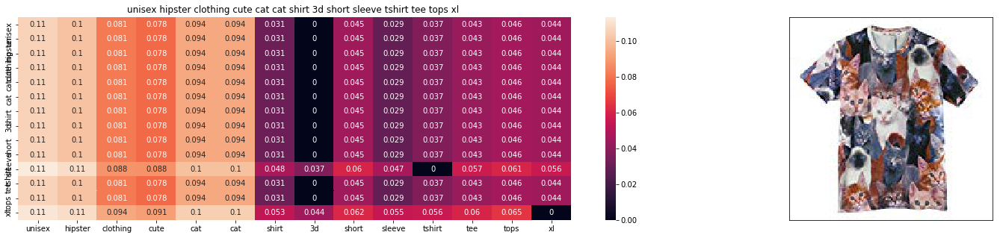

ASIN : B00OM4EF60
Brand : Moji
euclidean distance from input : 2.036171497225605


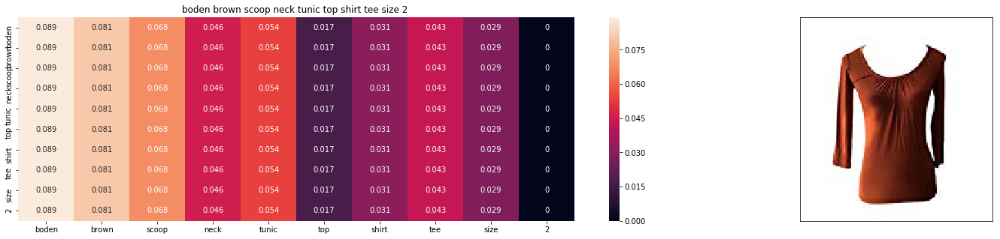

ASIN : B0718ZFSY7
Brand : BODEN
euclidean distance from input : 2.036266407597992


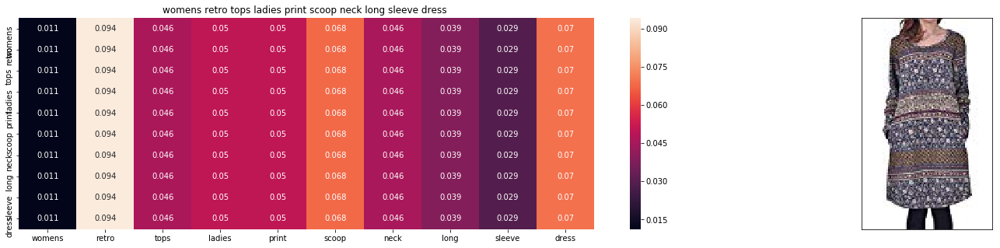

ASIN : B00NQR7GY2
Brand : Thenice
euclidean distance from input : 2.036272190061326


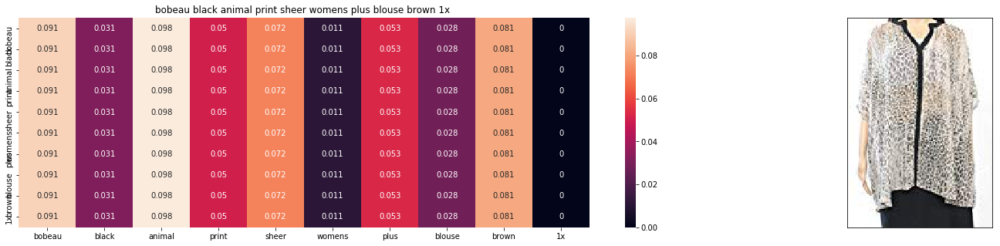

ASIN : B074MH886R
Brand : Bobeau
euclidean distance from input : 2.0362937951194757


In [51]:
# Imp to 'idf'  = 5
# and 
# Imp to '[brand + type(shirt/top) + color]' = 50

idf_w2v_brand(12566, 5, 50, 20)

# Keras and Tensorflow to extract features

In [52]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
import requests
from PIL import Image
from io import BytesIO

Using TensorFlow backend.


In [53]:
data.shape

(16042, 7)

In [54]:
data.head(1)

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26


In [55]:
data['medium_image_url'].iloc[0]

'https://images-na.ssl-images-amazon.com/images/I/31VspXbakvL._SL160_.jpg'

In [56]:
# https://gist.github.com/fchollet/f35fbc80e066a49d65f1688a7e99f069
# Code reference: https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html



# This code takes 40 minutes to run on a modern GPU (graphics card) 
# like Nvidia  1050.
# GPU (NVidia 1050): 0.175 seconds per image

# This codse takes 160 minutes to run on a high end i7 CPU
# CPU (i7): 0.615 seconds per image.

#Do NOT run this code unless you want to wait a few hours for it to generate output

# each image is converted into 25088 length dense-vector


'''
# dimensions of our images.
img_width, img_height = 224, 224

top_model_weights_path = 'bottleneck_fc_model.h5'
train_data_dir = 'images2/'
nb_train_samples = 16042
epochs = 50
batch_size = 1


def save_bottlebeck_features():
    
    #Function to compute VGG-16 CNN for image feature extraction.
    
    asins = []
    datagen = ImageDataGenerator(rescale=1. / 255)
    
    # build the VGG16 network
    model = applications.VGG16(include_top=False, weights='imagenet')
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    for i in generator.filenames:
        asins.append(i[2:-5])

    bottleneck_features_train = model.predict_generator(generator, nb_train_samples // batch_size)
    bottleneck_features_train = bottleneck_features_train.reshape((16042,25088))
    
    np.save(open('16k_data_cnn_features.npy', 'wb'), bottleneck_features_train)
    np.save(open('16k_data_cnn_feature_asins.npy', 'wb'), np.array(asins))
    

save_bottlebeck_features()

'''

"\n# dimensions of our images.\nimg_width, img_height = 224, 224\n\ntop_model_weights_path = 'bottleneck_fc_model.h5'\ntrain_data_dir = 'images2/'\nnb_train_samples = 16042\nepochs = 50\nbatch_size = 1\n\n\ndef save_bottlebeck_features():\n    \n    #Function to compute VGG-16 CNN for image feature extraction.\n    \n    asins = []\n    datagen = ImageDataGenerator(rescale=1. / 255)\n    \n    # build the VGG16 network\n    model = applications.VGG16(include_top=False, weights='imagenet')\n    generator = datagen.flow_from_directory(\n        train_data_dir,\n        target_size=(img_width, img_height),\n        batch_size=batch_size,\n        class_mode=None,\n        shuffle=False)\n\n    for i in generator.filenames:\n        asins.append(i[2:-5])\n\n    bottleneck_features_train = model.predict_generator(generator, nb_train_samples // batch_size)\n    bottleneck_features_train = bottleneck_features_train.reshape((16042,25088))\n    \n    np.save(open('16k_data_cnn_features.npy', 'w

# Visual features based product similarity.

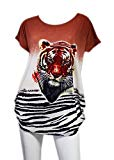

Product Title:  burnt umber tiger tshirt zebra stripes xl  xxl 
Euclidean Distance from input image: 6.32596e-06
Amazon Url: www.amzon.com/dp/B00JXQB5FQ


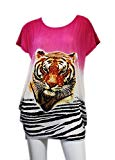

Product Title:  pink tiger tshirt zebra stripes xl  xxl 
Euclidean Distance from input image: 30.05017
Amazon Url: www.amzon.com/dp/B00JXQASS6


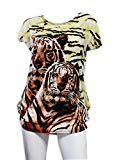

Product Title:  yellow tiger tshirt tiger stripes  l 
Euclidean Distance from input image: 41.261116
Amazon Url: www.amzon.com/dp/B00JXQCUIC


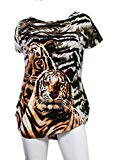

Product Title:  brown  white tiger tshirt tiger stripes xl  xxl 
Euclidean Distance from input image: 44.000156
Amazon Url: www.amzon.com/dp/B00JXQCWTO


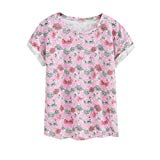

Product Title:  kawaii pastel tops tees pink flower design 
Euclidean Distance from input image: 47.38248
Amazon Url: www.amzon.com/dp/B071FCWD97


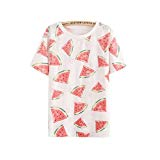

Product Title:  womens thin style tops tees pastel watermelon print 
Euclidean Distance from input image: 47.71842
Amazon Url: www.amzon.com/dp/B01JUNHBRM


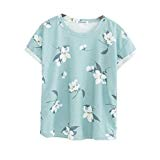

Product Title:  kawaii pastel tops tees baby blue flower design 
Euclidean Distance from input image: 47.90206
Amazon Url: www.amzon.com/dp/B071SBCY9W


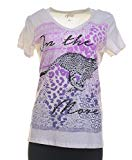

Product Title:  edv cheetah run purple multi xl 
Euclidean Distance from input image: 48.046482
Amazon Url: www.amzon.com/dp/B01CUPYBM0


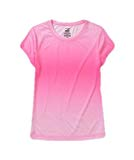

Product Title:  danskin womens vneck loose performance tee xsmall pink ombre 
Euclidean Distance from input image: 48.101837
Amazon Url: www.amzon.com/dp/B01F7PHXY8


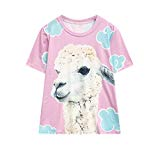

Product Title:  summer alpaca 3d pastel casual loose tops tee design 
Euclidean Distance from input image: 48.118866
Amazon Url: www.amzon.com/dp/B01I80A93G


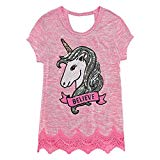

Product Title:  miss chievous juniors striped peplum tank top medium shadowpeach 
Euclidean Distance from input image: 48.13122
Amazon Url: www.amzon.com/dp/B0177DM70S


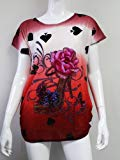

Product Title:  red  pink floral heel sleeveless shirt xl  xxl 
Euclidean Distance from input image: 48.16945
Amazon Url: www.amzon.com/dp/B00JV63QQE


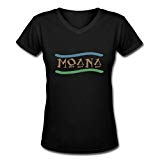

Product Title:  moana logo adults hot v neck shirt black xxl 
Euclidean Distance from input image: 48.256786
Amazon Url: www.amzon.com/dp/B01LX6H43D


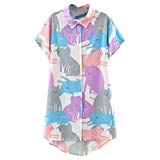

Product Title:  abaday multicolor cartoon cat print short sleeve longline shirt large 
Euclidean Distance from input image: 48.265686
Amazon Url: www.amzon.com/dp/B01CR57YY0


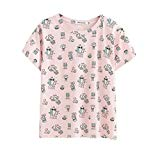

Product Title:  kawaii cotton pastel tops tees peach pink cactus design 
Euclidean Distance from input image: 48.362602
Amazon Url: www.amzon.com/dp/B071WYLBZS


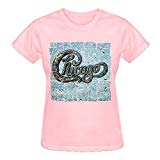

Product Title:  chicago chicago 18 shirt women pink 
Euclidean Distance from input image: 48.383606
Amazon Url: www.amzon.com/dp/B01GXAZTRY


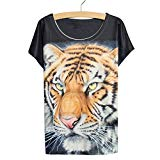

Product Title:  yichun womens tiger printed summer tshirts tops 
Euclidean Distance from input image: 48.449356
Amazon Url: www.amzon.com/dp/B010NN9RXO


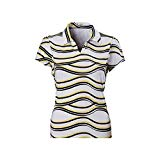

Product Title:  nancy lopez whimsy short sleeve  whiteblacklemon drop  xs 
Euclidean Distance from input image: 48.47889
Amazon Url: www.amzon.com/dp/B01MPX6IDX


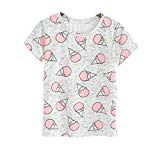

Product Title:  womens tops tees pastel peach ice cream cone print 
Euclidean Distance from input image: 48.557957
Amazon Url: www.amzon.com/dp/B0734GRKZL


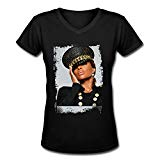

Product Title:  uswomens mary j blige without tshirts shirt 
Euclidean Distance from input image: 48.614372
Amazon Url: www.amzon.com/dp/B01M0XXFKK


In [56]:
#load the features and corresponding ASINS info.
bottleneck_features_train = np.load('16k_data_cnn_features.npy')

asins = np.load('16k_data_cnn_feature_asins.npy')
asins = list(asins)
df_asins = list(data['asin'])

from IPython.display import display, Image, SVG, Math, YouTubeVideo

#get similar products using CNN features (VGG-16)
def get_similar_products_cnn(doc_id, num_results):
    doc_id = asins.index(df_asins[doc_id])
    pairwise_dist = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))

    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    for i in range(len(indices)):
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])

get_similar_products_cnn(12566, 20)


# Assignment

In [79]:
def idf_exfeat_image(doc_id, w1, w2, w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id]) # 3 items [brand + type(shirt/top) + color]
    image = pairwise_distances(bottleneck_features_train, bottleneck_features_train[doc_id].reshape(1,-1))
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist + w3 * image) / float(w1 + w2 + w3)

    # np.argsort will return indices of 20 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 20 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 20 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0, len(indices)):
        # sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], 
                           data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        
        rows = data[['medium_image_url','title']].loc[data['asin']==asins[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['medium_image_url'], embed=True))
            print('Product Title: ', row['title'])
            print('Euclidean Distance from input image:', pdists[i])
            print('Amazon Url: www.amzon.com/dp/'+ asins[indices[i]])
        print('='*125)


AttributeError: type object 'Image' has no attribute 'open'

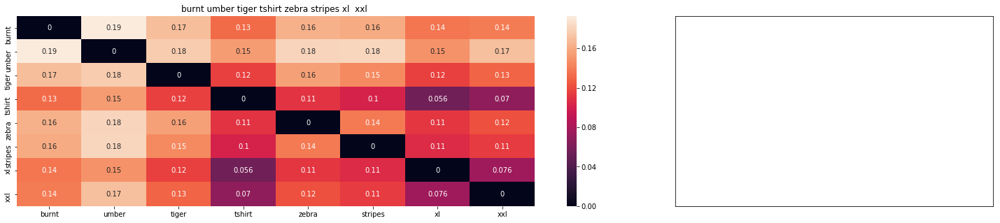

In [80]:
# same imp to 'idf' and '[brand + type(shirt/top) + color]' and 'Image'

idf_exfeat_image(12566, 5, 5, 5, 10)